# Предобработка данных

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Загрузим датасет Flickr 30:

In [0]:
!wget http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar

--2020-05-15 21:25:06--  http://shannon.cs.illinois.edu/DenotationGraph/data/flickr30k-images.tar
Resolving shannon.cs.illinois.edu (shannon.cs.illinois.edu)... 18.220.149.166
Connecting to shannon.cs.illinois.edu (shannon.cs.illinois.edu)|18.220.149.166|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4440780800 (4.1G) [application/x-tar]
Saving to: ‘flickr30k-images.tar’

flickr30k-images.ta 100%[===================>]   4.14G  15.2MB/s    in 4m 37s  

2020-05-15 21:29:45 (15.3 MB/s) - ‘flickr30k-images.tar’ saved [4440780800/4440780800]



In [0]:
%%time
!tar -xf '/content/flickr30k-images.tar'

CPU times: user 161 ms, sys: 25.9 ms, total: 187 ms
Wall time: 1min 16s


In [0]:
from torchvision import transforms, datasets
import os
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from torch.utils.data import Dataset, DataLoader
import random

Сохраним путь до папки с изображениями:

In [0]:
image_dir = '/content/flickr30k-images'

image_transform = transforms.Compose([
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

## Подготовка captions

Изначально я скачала датасет Flickr 30 на Kaggle, но архив с изображениями оттуда весил 8 Гб вместо 4 Гб, поэтому я нашла его в другом месте. Но вот файл с аннотациями results.csv оставила. Правда в нем был пропущен разделитель в одной строке (вроде бы № 19999), поэтому я его добавила, так получился файл results_new.csv (прилагается). В нем содержится список имен файлов картинок и соответствующие им заголовки. Одной картинке соответствует 5 строк из файла. 

In [0]:
results = pd.read_csv("/content/drive/My Drive/Image Captioning/Flickr30/results_new.csv", sep='|', index_col=None)

In [0]:
results.head(15)

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .
5,10002456.jpg,0,Several men in hard hats are operating a gian...
6,10002456.jpg,1,Workers look down from up above on a piece of...
7,10002456.jpg,2,Two men working on a machine wearing hard hats .
8,10002456.jpg,3,Four men on top of a tall structure .
9,10002456.jpg,4,Three men on a large rig .


In [0]:
# Переименуем колонки, чтобы убрать пробелы в начале имени
results.columns = ['image_name', 'comment_number', 'comment']

In [0]:
# Приведем строки к нижнему регистру
results.comment = results.comment.str.lower()

In [0]:
# Объединим все заголовки для одной картинки в один массив
results = results.groupby('image_name')['comment'].apply(list).reset_index(name='captions')

In [0]:
results

,image_name,captions
0,1000092795.jpg,[ two young guys with shaggy hair look at thei...
1,10002456.jpg,[ several men in hard hats are operating a gia...
2,1000268201.jpg,[ a child in a pink dress is climbing up a set...
3,1000344755.jpg,[ someone in a blue shirt and hat is standing ...
4,1000366164.jpg,"[ two men , one in a gray shirt , one in a bla..."
...,...,...
31778,997338199.jpg,"[ woman writing on a pad in room with gold , d..."
31779,997722733.jpg,[ a person in a red shirt climbing up a rock f...
31780,997876722.jpg,[ two male construction workers are working on...
31781,99804383.jpg,[ an older busker in glasses plays an eastern ...


In [0]:
results.image_name[0]

'1000092795.jpg'

In [0]:
results.captions[0]

[' two young guys with shaggy hair look at their hands while hanging out in the yard .',
 ' two young , white males are outside near many bushes .',
 ' two men in green shirts are standing in a yard .',
 ' a man in a blue shirt standing in a garden .',
 ' two friends enjoy time spent together .']

In [0]:
len(results)

31783

Разделим датафрейм на train и val:

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [0]:
from sklearn.model_selection import train_test_split

train_set, val_set = train_test_split(results, test_size=1024)

In [0]:
val_set.index = range(len(val_set))

In [0]:
val_set

,image_name,captions
0,3655176735.jpg,[ an older woman appears to read from a childr...
1,7669392800.jpg,[ numerous bicyclists wearing bicyclist appare...
2,4546029322.jpg,[ in this picture we see multiple people cross...
3,120764850.jpg,[ a baby on the floor laughing at an older ano...
4,2912210904.jpg,[ a man loads trees onto a cart on the side of...
...,...,...
1019,6813684611.jpg,[ three people are playing music ; two with vi...
1020,3288203502.jpg,[ redheaded woman holding clear plastic over p...
1021,6221289833.jpg,[ a boy wearing a white and green athletic uni...
1022,241345323.jpg,[ sooners football player number 50 plays in a...


In [0]:
train_set.index = range(len(train_set))

In [0]:
train_set

,image_name,captions
0,2251277216.jpg,[ various people are walking along a path towa...
1,263216826.jpg,[ a man and a woman in an orange shirt are sit...
2,3627929314.jpg,[ a little boy sitting on the ground looking u...
3,3019986034.jpg,[ a woman in a plaid skirt is playing a violin...
4,4508999124.jpg,[ a small boy with a blue and yellow backpack ...
...,...,...
30754,7108301125.jpg,[ several women are playing some sort of sport...
30755,2380519648.jpg,[ a man with a cap and not wearing shirt is la...
30756,128396207.jpg,"[ a bike rider with khaki green shorts , a blu..."
30757,361831875.jpg,[ a person in a green coat looks upwards while...


Посчитаем число вхождений каждого слова из заголовков для обучения:

In [0]:
from collections import Counter
token_counts = Counter()

for cap in train_set.captions:
    for line in cap:
        token_counts.update(line.split())

In [0]:
token_counts.most_common(10)

[('a', 263031),
 ('.', 146139),
 ('in', 80901),
 ('the', 61002),
 ('on', 44158),
 ('and', 42866),
 ('man', 41190),
 ('is', 39806),
 ('of', 37532),
 ('with', 35041)]

Составим словарь токенов:

In [0]:
min_count = 5
tokens = [token for token, num in token_counts.items() if num>=min_count]

Добавим в словарь специальные символы:

In [0]:
UNK, PAD, BOS, EOS = "UNK", "PAD", "<bos>", "<eos>"
tokens = [PAD, BOS, EOS, UNK] + tokens

In [0]:
len(tokens)

7639

In [0]:
n_tokens = len(tokens)

Построим словарь для перевода токенов в индексы:

In [0]:
token_to_id = {t:i for i, t in enumerate(tokens)}

In [0]:
UNK_IDX, PAD_IDX = token_to_id["UNK"], token_to_id["PAD"]
BOS_IDX, EOS_IDX = token_to_id["<bos>"], token_to_id["<eos>"]

## Формирование датасетов для обучения и валидации

In [0]:
def as_matrix(sequences, max_len=None):
    """ 
    Convert a list of tokens into a matrix with padding 
    params:
        sequences: list of sentences. Each sentence is a tokenized string or list of tokens
        max_len: if specified, 
    """

    if isinstance(sequences[0], str):
        sequences = list(map(str.split, sequences))
    
    max_len = min(max(map(len, sequences)), max_len or float('inf'))
    
    matrix = np.full((len(sequences), max_len+2), np.int32(PAD_IDX))
    for i,seq in enumerate(sequences):
        row_ix = [BOS_IDX] + [token_to_id.get(word, UNK_IDX) for word in seq[:max_len]] + [EOS_IDX]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [0]:
# batch generator
from random import choice

def generate_batch(dataset, batch_size, max_caption_len=None):
    
    #sample random numbers for image/caption indicies
    random_index = np.random.randint(0, len(dataset), size=batch_size)
    
    batch_images, batch_captions = None, []

    for ind in random_index:

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)

        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64)
    

In [0]:
class FlickrDataset(Dataset):
    """Flickr30 dataset."""

    def __init__(self, data_frame, root_dir, image_transform):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data_frame = data_frame 
        self.root_dir = root_dir
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        
        image_name = os.path.join(self.root_dir,
                                self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        image = np.array(Image.fromarray(image).resize((256, 256))).astype('float32') / 255.
        image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
        if self.image_transform is not None:
            image = self.image_transform(image)

        captions = self.data_frame.captions[idx]

        return image, captions

    def show_sample(self, idx):

        image_name = os.path.join(self.root_dir,
                                self.data_frame.image_name[idx])
        image = plt.imread(image_name)
        image = np.array(Image.fromarray(image).resize((299, 299))).astype('float32') / 255.

        captions = self.data_frame.captions[idx]
        captions = np.array(captions)

        plt.imshow(image)
        print(captions)

### Train dataset

In [0]:
train_dataset = FlickrDataset(train_set, image_dir, image_transform)

In [0]:
len(train_dataset)

30759

Посмотрим на примеры из датасета для обучения:

[' various people are walking along a path towards a fenced-in area that is surrounded by small buildings .'
 ' people running on a sidewalk in the middle of a grassy area .'
 ' people running and walking in and out of a small farm town .'
 ' several couples running down the road to a farm house .'
 ' a woman runs along the sidewalk .']


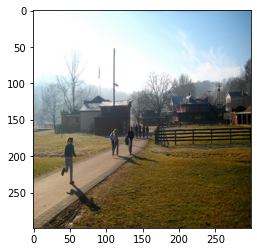

In [0]:
train_dataset.show_sample(0)

[' crowded street with a man holding a subway sign pointing customers to a subway sandwich shop .'
 ' a man dressed in blue , holding a subway sandwich sign on the sidewalk .'
 ' a man in a blue shirt and blue jeans standing behind a subway sign .'
 ' a man in all bright blue against a subway sign in new york city .'
 ' man holding a sign promoting subway restaurant .']


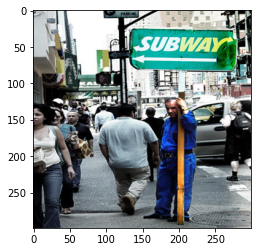

In [0]:
train_dataset.show_sample(12345)

Протестируем генерацию батча:

In [0]:
# max_caption_len без учета спец символов для начала и конца предложения
batch = generate_batch(train_dataset, 3, max_caption_len=10)

In [0]:
batch[1]

tensor([[   1,    9,  412,    5,   45,   35,   29, 1611,   22,    9,  409,    2],
        [   1,  180,   15,   42,  515,  421,   56,  422,   27, 1201,  208,    2],
        [   1,   25,  249,   15,   87, 2255, 2857,   56,  619,  106,   24,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 12]))

In [0]:
batch = generate_batch(train_dataset, 3)

In [0]:
batch[1]

tensor([[   1,    9,   63,  122,   98,    9, 4666,  137,  251,   30,  208,   25,
           91,   63,  122,   37,  807,   20,    2,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,    9,   41,   24,    9,  139,  110,   48, 4946,   76,   48,   25,
          303,  203,    9,  155,   27,  133, 1525,   20,    2,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   1,   61,  108,   68,   87,  100,  170,   56,    9,   94,  111,   29,
           94,   29,  520,  116,   87,    9, 3844,  112,   25,   91,   74,    9,
         2489,   29,    9, 7567, 1645,   44,   87,    9, 2447,   20,    2]])

In [0]:
batch[0].shape, batch[1].shape

(torch.Size([3, 3, 256, 256]), torch.Size([3, 35]))

### Validation dataset

In [0]:
# Переводит массив индексов в строку/массив с токенами (до первого символа конца строки)
def translate(list_ind, to_str=True):
  
  if EOS_IDX in list_ind:
    max_ind = list_ind.index(EOS_IDX)
  else:
    max_ind = len(list_ind)

  if to_str:
    return (' ').join([tokens[ind] for ind in list_ind[:max_ind]])
  else:
    return [tokens[ind] for ind in list_ind[:max_ind]]

In [0]:
import nltk
from nltk.translate.bleu_score import corpus_bleu

In [0]:
val_dataset = FlickrDataset(val_set, image_dir, image_transform)

In [0]:
len(val_dataset)

1024

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


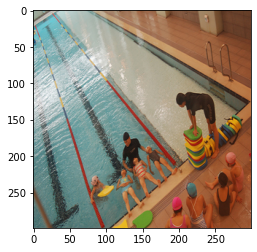

In [0]:
# Fixed example
val_dataset.show_sample(992)

In [0]:
batch_size_val = 32

In [0]:
val_size = len(val_dataset) 

In [0]:
val_size

1024

In [0]:
# Для расчета bleu
references = []
for cap in val_set.captions[:val_size]:
  new_cap = []
  for str_cap in cap:
    new_cap.append(list(str_cap.split()))
  references.append(new_cap)

In [0]:
references[0]

[['an',
  'older',
  'woman',
  'appears',
  'to',
  'read',
  'from',
  'a',
  'children',
  "'s",
  'book',
  'in',
  'an',
  'indoor',
  'setting',
  ',',
  'while',
  'a',
  'seated',
  'gentleman',
  'in',
  'a',
  'service',
  'uniform',
  'looks',
  'on',
  '.'],
 ['a',
  'woman',
  'with',
  'short',
  'black',
  'hair',
  'and',
  'a',
  'colorful',
  'necklace',
  'reads',
  'a',
  'children',
  "'s",
  'illustration',
  'book',
  '.'],
 ['a',
  'woman',
  'with',
  'a',
  'white',
  'shirt',
  'holding',
  'a',
  'children',
  'book',
  '.'],
 ['a', 'woman', 'reading', 'a', 'children', "'s", 'book', '.'],
 ['a', 'lady', 'reading', 'a', 'story', 'book', '.']]

In [0]:
# batch generator
def generate_batch_val(dataset, indx, batch_size, max_caption_len=None):
    
    batch_images, batch_captions = None, []

    for ind in range(indx, indx+batch_size):

        image, captions = dataset[ind]

        if batch_images is None:
            batch_images = image.unsqueeze(0)
        else:
            batch_images = torch.cat((batch_images, image.unsqueeze(0)), 0)

        caption = choice(captions)

        batch_captions.append(caption)

    batch_captions = as_matrix(batch_captions, max_caption_len)
    
    return batch_images, torch.tensor(batch_captions, dtype=torch.int64)
    

In [0]:
def evaluate(model, criterion, max_len=None, val_size=len(val_dataset), batch_size=batch_size_val):
    
    model.eval()
    
    epoch_loss = 0
    bleu = 0
    hypotheses = []

    # Не учитываем последний неполный батч
    val_size = val_size // batch_size * batch_size

    random_ind = random.randint(0, val_size-1)
    
    with torch.no_grad():
    
        for i in range(0, val_size, batch_size):

            image_vectors, captions_ix = generate_batch_val(val_dataset, i, batch_size) 
            
            image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

            captions_ix_next = captions_ix[:, 1:].contiguous()
        
            outputs = network.predict(image_vectors, captions_ix) 

            loss = criterion(outputs.contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
            
            epoch_loss += loss.item()

            outputs_max = outputs.argmax(-1)
            for out in outputs_max:
              hypotheses.append(translate(out.tolist(), to_str=False))

            if random_ind in range(i,i+batch_size):
              print('Random example:')
              print('\tTarget: {}'.format(translate(captions_ix_next[random_ind % batch_size].tolist())))
              print('\tOutput: {}'.format(translate(outputs.argmax(-1)[random_ind % batch_size].tolist())))

    print('Fixed example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs.argmax(-1)[0].tolist())))

    bleu = corpus_bleu(references, hypotheses)
        
    return epoch_loss / (val_size // batch_size), bleu*100

# Посторение нейросети

In [0]:
!pip install transformers

     |████████████████████████████████| 645kB 2.8MB/s 
     |████████████████████████████████| 890kB 12.5MB/s 
     |████████████████████████████████| 1.1MB 16.8MB/s 
     |████████████████████████████████| 3.8MB 24.3MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893260 sha256=cc77616c4017b84e153a38bfb1d78b486a7004fe8e17ee91fc9d99858da676c9
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses


##Encoder

In [0]:
class Encoder(nn.Module):
    """
    Encoder.
    """

    def __init__(self):
        super(Encoder, self).__init__()
        
        resnet = models.resnet101(pretrained=True) 

        # Удаляем пулинг и последний линейный слой
        # На выходе будем получать тензор (batch_size, 2048, 8, 8)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        self.fine_tune()

    def forward(self, images):
        """
        Forward propagation.
        :param images: images, a tensor of dimensions (batch_size, 3, image_size, image_size)
        :return: encoded images
        """
        # (batch_size, 2048, 8, 8)
        out = self.resnet(images)

        batch_size = out.shape[0]
        emb_size = out.shape[1]

        return out.permute(2, 3, 0, 1).view(-1, batch_size, emb_size) 

    def fine_tune(self, fine_tune=False):
        """
        Allow or prevent the computation of gradients for convolutional blocks 2 through 4 of the encoder.
        :param fine_tune: Allow?
        """
        for p in self.resnet.parameters():
            p.requires_grad = False

## Decoder

In [0]:
import copy
from typing import Optional

import torch
from torch import Tensor

In [0]:
class Embeddings(nn.Module):
    def __init__(self, vocab_size=n_tokens, hidden_size=512, max_position_embeddings=100, hidden_dropout_prob=0.1, layer_norm_eps=1e-12):
        super().__init__()
        self.word_embeddings = nn.Embedding(vocab_size, hidden_size, padding_idx=PAD_IDX)
        self.position_embeddings = nn.Embedding(max_position_embeddings, hidden_size)

        self.LayerNorm = nn.LayerNorm(hidden_size, eps=layer_norm_eps)
        self.dropout = nn.Dropout(hidden_dropout_prob)

    def forward(self, input_ids):
        input_shape = input_ids.size()
        seq_length = input_shape[1]
        device = input_ids.device

        position_ids = torch.arange(seq_length, dtype=torch.long, device=device)
        position_ids = position_ids.unsqueeze(0).expand(input_shape)

        inputs_embeds = self.word_embeddings(input_ids)
        position_embeddings = self.position_embeddings(position_ids)

        embeddings = inputs_embeds + position_embeddings
        embeddings = self.LayerNorm(embeddings)
        embeddings = self.dropout(embeddings)
        return embeddings

Добавляем вывод весов внимания в декодере:

In [0]:
class TransformerDecoderLayer(nn.Module):
    r"""TransformerDecoderLayer is made up of self-attn, multi-head-attn and feedforward network.
    This standard decoder layer is based on the paper "Attention Is All You Need".
    Ashish Vaswani, Noam Shazeer, Niki Parmar, Jakob Uszkoreit, Llion Jones, Aidan N Gomez,
    Lukasz Kaiser, and Illia Polosukhin. 2017. Attention is all you need. In Advances in
    Neural Information Processing Systems, pages 6000-6010. Users may modify or implement
    in a different way during application.
    Args:
        d_model: the number of expected features in the input (required).
        nhead: the number of heads in the multiheadattention models (required).
        dim_feedforward: the dimension of the feedforward network model (default=2048).
        dropout: the dropout value (default=0.1).
        activation: the activation function of intermediate layer, relu or gelu (default=relu).
    Examples::
        >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8)
        >>> memory = torch.rand(10, 32, 512)
        >>> tgt = torch.rand(20, 32, 512)
        >>> out = decoder_layer(tgt, memory)
    """

    def __init__(self, d_model, nhead, dim_feedforward=2048, dropout=0.1, activation="relu"):
        super(TransformerDecoderLayer, self).__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Implementation of Feedforward model
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)

        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

        self.activation = _get_activation_fn(activation)

    def __setstate__(self, state):
        if 'activation' not in state:
            state['activation'] = F.relu
        super(TransformerDecoderLayer, self).__setstate__(state)

    def forward(self, tgt, memory, tgt_mask=None, memory_mask=None,
                tgt_key_padding_mask=None, memory_key_padding_mask=None):
        # type: (Tensor, Tensor, Optional[Tensor], Optional[Tensor], Optional[Tensor], Optional[Tensor]) -> Tensor
        r"""Pass the inputs (and mask) through the decoder layer.
        Args:
            tgt: the sequence to the decoder layer (required).
            memory: the sequence from the last layer of the encoder (required).
            tgt_mask: the mask for the tgt sequence (optional).
            memory_mask: the mask for the memory sequence (optional).
            tgt_key_padding_mask: the mask for the tgt keys per batch (optional).
            memory_key_padding_mask: the mask for the memory keys per batch (optional).
        Shape:
            see the docs in Transformer class.
        """
        tgt2 = self.self_attn(tgt, tgt, tgt, attn_mask=tgt_mask,
                              key_padding_mask=tgt_key_padding_mask)[0]
        tgt = tgt + self.dropout1(tgt2)
        tgt = self.norm1(tgt)
        tgt2, attention = self.multihead_attn(tgt, memory, memory, attn_mask=memory_mask,
                                   key_padding_mask=memory_key_padding_mask) #[0]
        tgt = tgt + self.dropout2(tgt2)
        tgt = self.norm2(tgt)
        tgt2 = self.linear2(self.dropout(self.activation(self.linear1(tgt))))
        tgt = tgt + self.dropout3(tgt2)
        tgt = self.norm3(tgt)
        return tgt, attention


def _get_clones(module, N):
    return nn.ModuleList([copy.deepcopy(module) for i in range(N)])


def _get_activation_fn(activation):
    if activation == "relu":
        return F.relu
    elif activation == "gelu":
        return F.gelu

    raise RuntimeError("activation should be relu/gelu, not {}".format(activation))

In [0]:
class TransformerDecoder(nn.Module):
    r"""TransformerDecoder is a stack of N decoder layers
    Args:
        decoder_layer: an instance of the TransformerDecoderLayer() class (required).
        num_layers: the number of sub-decoder-layers in the decoder (required).
        norm: the layer normalization component (optional).
    Examples::
        >>> decoder_layer = nn.TransformerDecoderLayer(d_model=512, nhead=8)
        >>> transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=6)
        >>> memory = torch.rand(10, 32, 512)
        >>> tgt = torch.rand(20, 32, 512)
        >>> out = transformer_decoder(tgt, memory)
    """
    __constants__ = ['norm']

    def __init__(self, decoder_layer, num_layers, norm=None):
        super(TransformerDecoder, self).__init__()
        self.layers = _get_clones(decoder_layer, num_layers)
        self.num_layers = num_layers
        self.norm = norm

    def forward(self, tgt, memory, tgt_mask=None,
                memory_mask=None, tgt_key_padding_mask=None,
                memory_key_padding_mask=None):
        # type: (Tensor, Tensor, Optional[Tensor], Optional[Tensor], Optional[Tensor], Optional[Tensor]) -> Tensor
        r"""Pass the inputs (and mask) through the decoder layer in turn.
        Args:
            tgt: the sequence to the decoder (required).
            memory: the sequence from the last layer of the encoder (required).
            tgt_mask: the mask for the tgt sequence (optional).
            memory_mask: the mask for the memory sequence (optional).
            tgt_key_padding_mask: the mask for the tgt keys per batch (optional).
            memory_key_padding_mask: the mask for the memory keys per batch (optional).
        Shape:
            see the docs in Transformer class.
        """
        output = tgt

        for mod in self.layers:
            output, attention = mod(output, memory, tgt_mask=tgt_mask,
                         memory_mask=memory_mask,
                         tgt_key_padding_mask=tgt_key_padding_mask,
                         memory_key_padding_mask=memory_key_padding_mask)

        if self.norm is not None:
            output = self.norm(output)

        return output, attention

## Model

In [0]:
class TransformerModel(nn.Module):
    def __init__(self, encoder, outtoken, hidden=512, dim_feedforward=2048, 
                 nlayers=6, dropout=0.1, nhead=8, activation="relu"):
        super(TransformerModel, self).__init__()

        self.vocab_size = outtoken

        self.emb_decoder = Embeddings(outtoken, hidden) #BERT.embeddings #nn.Embedding(outtoken, hidden)

        self.encoder = encoder

        self.fc = nn.Linear(2048, hidden)

        decoder_layer = TransformerDecoderLayer(hidden, nhead, dim_feedforward, dropout, activation)
        decoder_norm = nn.LayerNorm(hidden)
        self.decoder = TransformerDecoder(decoder_layer, nlayers, decoder_norm)

        self.fc_out = nn.Linear(hidden, outtoken)

        self.init_weights()

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def make_len_mask(self, inp):
        return (inp == 0).transpose(0, 1)

    def init_weights(self):
        initrange = 0.1
        self.fc_out.bias.data.zero_()
        self.fc_out.weight.data.uniform_(-initrange, initrange)
        for p in self.decoder.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def forward(self, src, trg):

        trg = trg.permute(1, 0)

        trg_mask = self.generate_square_subsequent_mask(len(trg)).to(trg.device)

        trg_pad_mask = self.make_len_mask(trg)

        trg = self.emb_decoder(trg.permute(1, 0)).permute(1, 0, 2)

        # Делаем проход по ResNet
        with torch.no_grad():
            memory = self.encoder(src)

        # Приводим выход энкодера к нужному размеру
        memory = self.fc(memory) 

        # Делаем проход по декодеру
        output = self.decoder(trg, memory, tgt_mask=trg_mask, 
                              tgt_key_padding_mask=trg_pad_mask)[0]
        
        # Преобразуем к размеру словаря
        output = self.fc_out(output)

        return output.permute(1, 0, 2)

    def predict(self, src, tgt):

        memory = self.encoder(src)

        memory = self.fc(memory)

        outputs = torch.zeros(tgt.shape[0], tgt.shape[1], self.vocab_size).to(device)

        it = tgt[:, 0].clone().unsqueeze(1)

        states = it.clone()

        for i in range(1, tgt.shape[1]):
            
            states_emb = states.permute(1, 0)

            states_mask = self.generate_square_subsequent_mask(len(states_emb)).to(device)

            states_pad_mask = self.make_len_mask(states_emb)

            states_emb = self.emb_decoder(states_emb.permute(1, 0)).permute(1, 0, 2)
            
            output = self.fc_out(self.decoder(states_emb, memory, tgt_mask=states_mask, 
                              tgt_key_padding_mask=states_pad_mask)[0]).permute(1, 0, 2)

            it = output[:, -1].argmax(-1).unsqueeze(1)          

            states = torch.cat((states.float(), it.float()), dim=1).long()

            outputs[:, i] = output[:, -1]

        return outputs[:, 1:]

    def generate(self, src, max_len=30, sample=False, st=3):

        memory = self.encoder(src)

        memory = self.fc(memory)

        outputs = torch.zeros(max_len, self.vocab_size) 

        it = torch.tensor([BOS_IDX], dtype=torch.float64).unsqueeze(1).long().to(device) 

        states = it.clone()

        for i in range(1, max_len):
            
            states_emb = states.permute(1, 0)

            states_mask = self.generate_square_subsequent_mask(len(states_emb)).to(device)

            states_pad_mask = self.make_len_mask(states_emb)

            states_emb = self.emb_decoder(states_emb.permute(1, 0)).permute(1, 0, 2)
            
            output, attention = self.decoder(states_emb, memory, tgt_mask=states_mask, 
                              tgt_key_padding_mask=states_pad_mask)
            
            output = self.fc_out(output).permute(1, 0, 2)

            if sample:
                # Выбираем токен согласно полученному распределению вероятностей
                next_word_probs = F.softmax(output[0, -1], dim=-1).data.cpu().numpy()
                next_word_probs = next_word_probs ** st / np.sum(next_word_probs ** st)
                next_word = np.random.choice(np.arange(self.vocab_size), p=next_word_probs)

                it = torch.tensor([next_word], dtype=torch.float64).unsqueeze(1).long().to(device)

            else:
                # Берем токен с максимальной вероятностью
                it = output[:, -1].argmax(-1).unsqueeze(1)

            if it.item() == EOS_IDX:
                break         

            states = torch.cat((states.float(), it.float()), dim=1).long()

            outputs[i] = output[:, -1].detach().cpu()

        return translate(outputs[1:i].argmax(-1).tolist()), attention[0].detach().cpu()

# Training

In [0]:
seed = 42

random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

In [0]:
enc_nn = Encoder()
network = TransformerModel(enc_nn, n_tokens)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/checkpoints/resnet101-5d3b4d8f.pth


In [0]:
network

TransformerModel(
  (emb_decoder): Embeddings(
    (word_embeddings): Embedding(7639, 512, padding_idx=0)
    (position_embeddings): Embedding(100, 512)
    (LayerNorm): LayerNorm((512,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): Encoder(
    (resnet): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, aff

In [0]:
from transformers import AdamW, get_linear_schedule_with_warmup

In [0]:
max_epochs = 35000
batch_size = 32
every_epochs = 500 
clip = 5

In [0]:
learning_rate = 7e-5
num_warmup_steps = 3000

t_total = max_epochs 

optimizer_grouped_parameters = [
    {"params": [p for n, p in network.named_parameters()], "weight_decay": 0.0},
]

criterion = nn.CrossEntropyLoss(ignore_index = PAD_IDX)
optimizer = AdamW(optimizer_grouped_parameters, lr=learning_rate)
scheduler = get_linear_schedule_with_warmup(
    optimizer, num_warmup_steps=num_warmup_steps, num_training_steps=t_total
)

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [0]:
network = network.to(device)

In [0]:
pytorch_total_params = sum(p.numel() for p in network.parameters() if p.requires_grad)
pytorch_total_params

34156503

In [0]:
pytorch_total_params = sum(p.numel() for p in network.parameters())
pytorch_total_params

76656663

In [0]:
def plot_loss():

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,2)
    plt.title("Losses")
    plt.plot(train_losses, label="train loss")
    plt.plot(val_losses, label="val loss")
    plt.plot(np.argmin(val_losses), np.min(val_losses), marker="x", color="r", label="best val loss")
    plt.xlabel("Epochs")
    plt.ylabel("Losses")
    plt.legend()

    plt.subplot(1,2,1)
    plt.title("BLEU")
    plt.plot(bleu, label="val bleu")
    plt.plot(np.argmax(bleu), np.max(bleu), marker="x", color="b", label="best bleu")
    plt.xlabel("Epochs")
    plt.ylabel("BLEU")
    plt.legend()

    plt.show()

/pytorch/torch/csrc/utils/python_arg_parser.cpp:756: UserWarning: This overload of add_ is deprecated:
	add_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	add_(Tensor other, *, Number alpha)


Epoch : 500
Train example :
	Target: a group of people walk down the street waving rainbow flags .
	Output: a man in a in in a the in . . .
Random example:
	Target: a person wearing a hooded sweatshirt in a wooded area .
	Output: a man in a man in a is .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a man in a man in a man .
Train loss    : 6.694763519287109
Val loss      : 6.764661133289337
Val bleu      : 8.869542407192604



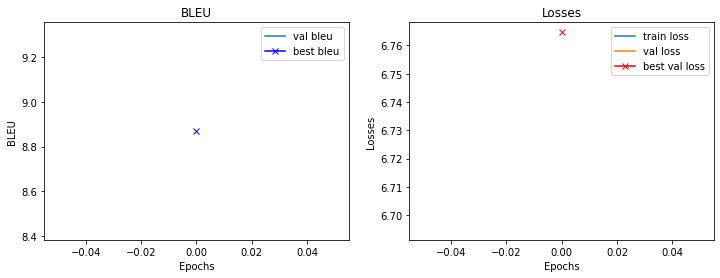

Epoch : 1000
Train example :
	Target: a dark-skinned man is laying bricks .
	Output: a man in in a a a
Random example:
	Target: a dog leaps on a man .
	Output: a man in a black shirt is is walking a white dog .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a red shirt is is sitting on a red .
Train loss    : 4.870756496429443
Val loss      : 6.693808019161224
Val bleu      : 6.197318541919686



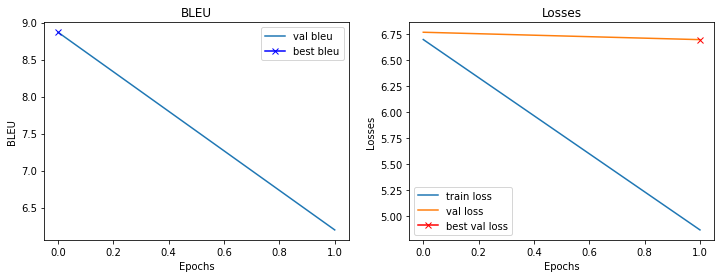

Epoch : 1500
Train example :
	Target: a car is being driven on a trail while people on both sides of the road look on .
	Output: a man is riding on in a UNK of a . a street . a background . . the
Random example:
	Target: a frisbee rolls into the ocean as two people , one being carried by the other , chase after it .
	Output: a man in a black shirt is walking on a beach .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a blue shirt is playing a red shirt is playing a UNK .
Train loss    : 4.326224257469177
Val loss      : 7.080329611897469
Val bleu      : 11.072790158049212



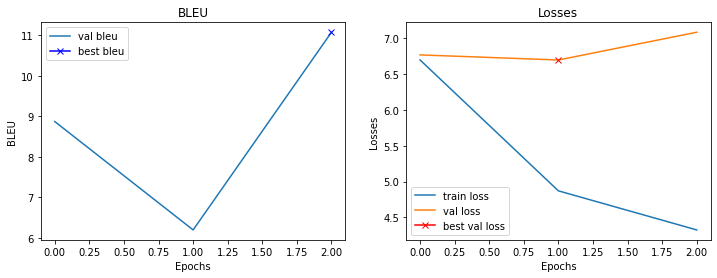

Epoch : 2000
Train example :
	Target: military families are marching through new york on a rainy day .
	Output: a people in walking UNK a . . a street other .
Random example:
	Target: a man and a woman are holding each other in the green grass while smiling .
	Output: a woman in a blue shirt and jeans is sitting on a bench .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a red shirt is sitting on a boat .
Train loss    : 4.041557654857636
Val loss      : 7.291182264685631
Val bleu      : 13.508577576181704



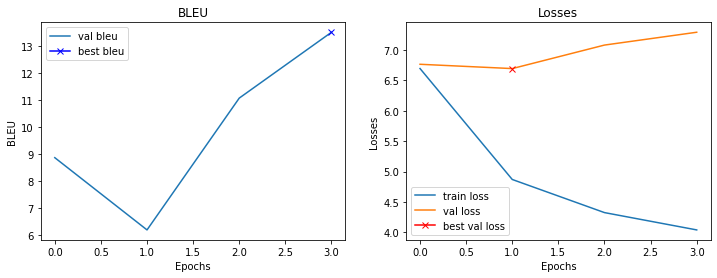

Epoch : 2500
Train example :
	Target: there are two large dogs running about in a field .
	Output: a is a dogs dogs are through . a field .
Random example:
	Target: a guy and a girl talking by the grocery aisle .
	Output: a woman in a black shirt is standing in front of a store .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a blue shirt is sitting on a boat .
Train loss    : 3.8465236163139345
Val loss      : 7.522631883621216
Val bleu      : 13.978655773359602



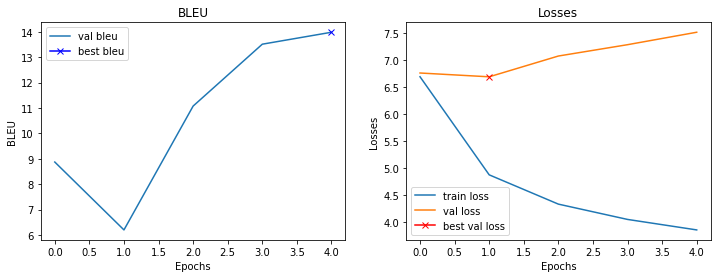

Epoch : 3000
Train example :
	Target: a young man skateboarding in front of the ocean .
	Output: a man boy is on a of a air .
Random example:
	Target: one brown and white dog chasing a black and white dog through the grass
	Output: a dog is running in a grassy field .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a blue shirt is sitting on a boat .
Train loss    : 3.687291356563568
Val loss      : 7.38503560423851
Val bleu      : 15.841954447435736



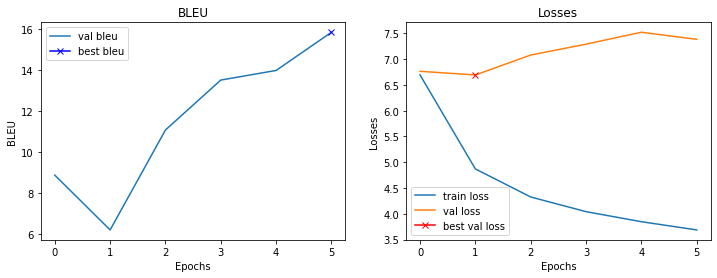

Epoch : 3500
Train example :
	Target: children are playing 3 on 3 ping-pong in a gym .
	Output: a playing playing with . the . . a game .
Random example:
	Target: a girl is lying on a short brick wall .
	Output: a man in a red shirt is sitting on a bench .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a blue shirt and blue shirt is sitting on a boat .
Train loss    : 3.5395862464904786
Val loss      : 7.563762605190277
Val bleu      : 13.865438233785104



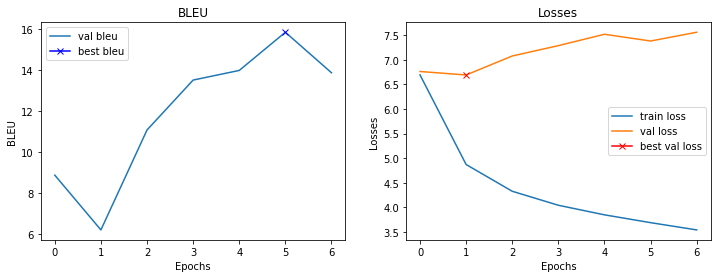

Epoch : 4000
Train example :
	Target: a guy with a red shirt walking .
	Output: a man is a red shirt is down
Random example:
	Target: a man with long hair is skateboarding in a skate park surrounded by houses .
	Output: a man in a black shirt is jumping on a skateboard .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a blue shirt is sitting on a boat .
Train loss    : 3.442495750427246
Val loss      : 7.64076192677021
Val bleu      : 15.206141613501995



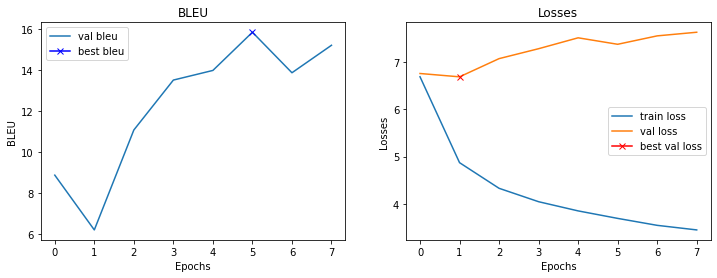

Epoch : 4500
Train example :
	Target: a black and white dog jumps over a bar .
	Output: a black dog white dog is over a fence .
Random example:
	Target: several people are in a front of a colorful painted building .
	Output: a group of people are walking down a street .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is sitting on a boat .
Train loss    : 3.353988883495331
Val loss      : 7.575171917676926
Val bleu      : 16.389874618679



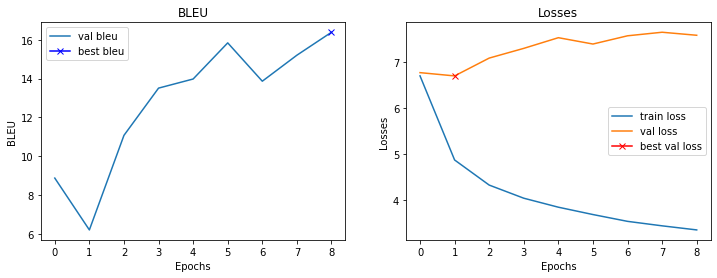

Epoch : 5000
Train example :
	Target: a teenage boy grinds his skateboard over a red rail .
	Output: a young boy is a skateboard on a skateboard skateboard .
Random example:
	Target: a man in a yellow and blue track jacket asking a woman for help .
	Output: a man in a yellow shirt and a yellow shirt is walking down the street .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man is sitting on a dock .
Train loss    : 3.2802222595214845
Val loss      : 7.539586246013641
Val bleu      : 17.474201391289164



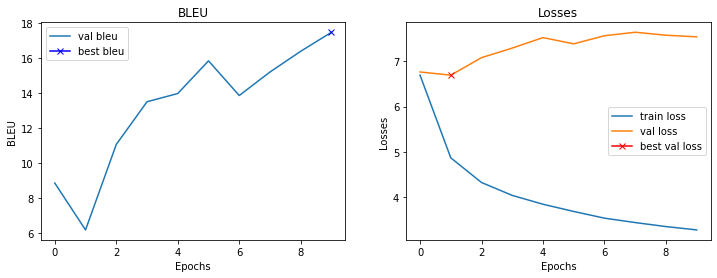

Epoch : 5500
Train example :
	Target: a woman and child smile for a picture .
	Output: a young in a are on the picture .
Random example:
	Target: three people skiing behind one another in snow .
	Output: a snowboarder is skiing down a snowy hill .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a blue shirt is sitting on a boat .
Train loss    : 3.2057243485450746
Val loss      : 7.701764330267906
Val bleu      : 17.145093156333715



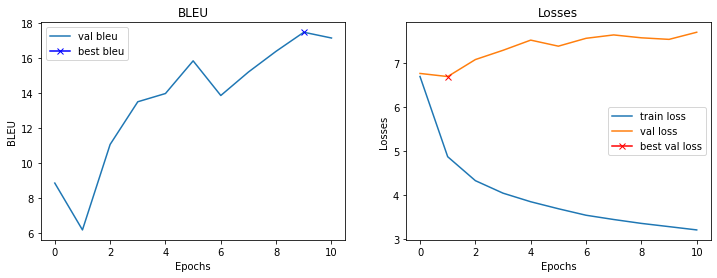

Epoch : 6000
Train example :
	Target: someone is pulling an inflatable boat with an oar in it .
	Output: a is sitting a object boat . a object . the .
Random example:
	Target: an elderly white man is playing a trumpet into a microphone .
	Output: a man in a red shirt is playing a guitar .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are sitting on a dock .
Train loss    : 3.167063519477844
Val loss      : 7.47093653678894
Val bleu      : 15.751535777203522



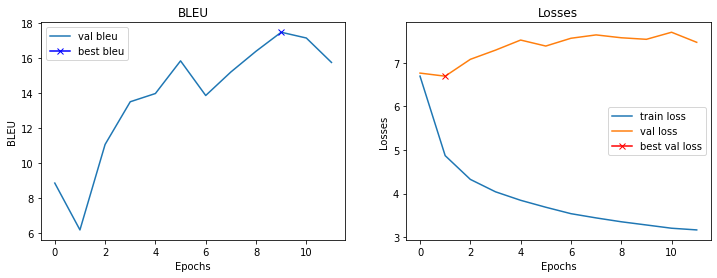

Epoch : 6500
Train example :
	Target: a female gymnast completely upside down with her arms supporting her on the high beam .
	Output: a gymnast jumps in in down in a legs in . legs the ground court .
Random example:
	Target: a person in the woods on a muddy trail rounds a corner on a bike .
	Output: a person in a red jacket is riding a bike in the woods .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a group of people are playing with a large ball .
Train loss    : 3.109016691684723
Val loss      : 7.537937253713608
Val bleu      : 18.70203708287254



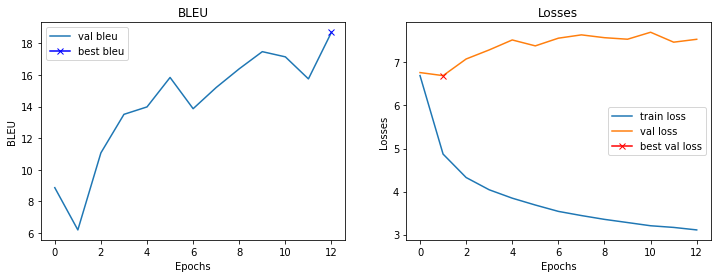

Epoch : 7000
Train example :
	Target: man crouched down painting a picture .
	Output: a in on a a picture of
Random example:
	Target: a skateboarder catches air over a dumpster as one friend observes and the other friend UNK .
	Output: a man in a black shirt is looking at a train .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man is sitting on a dock in a pool .
Train loss    : 3.0784731068611144
Val loss      : 7.6995856910943985
Val bleu      : 18.843883364379494



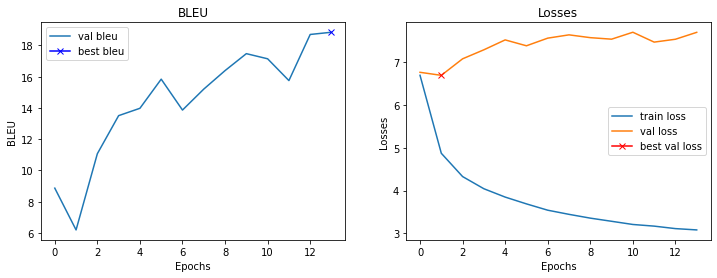

Epoch : 7500
Train example :
	Target: a large group of people , some holding red signs , near a bunch of buildings .
	Output: a large group of people are a in up and and and a city of people .
Random example:
	Target: here are young boys skating boarding in a service drive .
	Output: a man in a black shirt is working on a ladder .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: a man in a red shirt and black pants is sitting on a bench .
Train loss    : 3.043935900211334
Val loss      : 7.5071259289979935
Val bleu      : 18.093555540615196



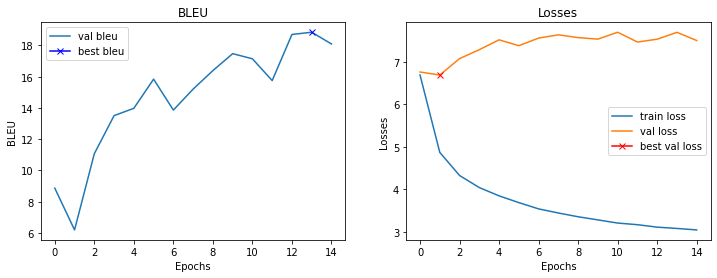

Epoch : 8000
Train example :
	Target: lady walking past a driving taxi .
	Output: a in down a yellow street .
Random example:
	Target: a boy swings a baseball bat , and a catcher stands behind him .
	Output: a man in a baseball uniform is playing a guitar .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: three men are playing in a pool .
Train loss    : 2.999437940120697
Val loss      : 7.387371197342873
Val bleu      : 16.630404878282608



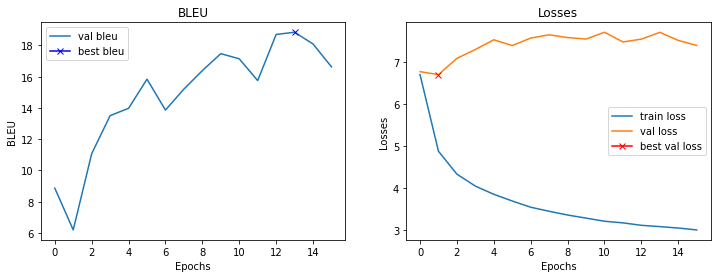

Epoch : 8500
Train example :
	Target: a woman in a purple outfit , on a bike , is kissing a man .
	Output: a woman in a white shirt is and a bike , with holding a picture in
Random example:
	Target: an older man in a white short-sleeve shirt admiring a bush .
	Output: a man in a white shirt is working on a ladder .
Fixed example :
	Target: a group of children learning to swim .
	Output: a man in a red shirt is sitting on a boat .
Train loss    : 2.9697181849479675
Val loss      : 7.490036368370056
Val bleu      : 18.921391689991495



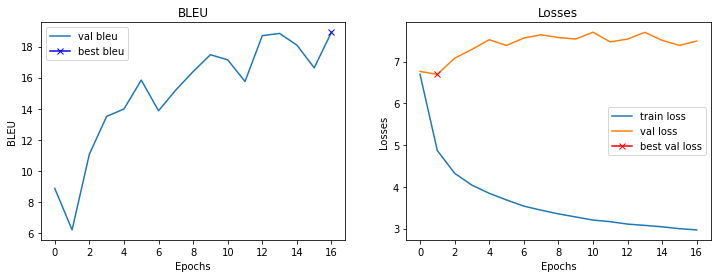

Epoch : 9000
Train example :
	Target: green trees , grass , one man standing , another bending down .
	Output: a and , two , two man and in and , to a
Random example:
	Target: two young boys are walking over a wet section of pavement , one is holding a hat over his head , the other is holding an umbrella .
	Output: a woman in a blue shirt and blue jeans is holding a umbrella .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are sitting on a boat .
Train loss    : 2.9300099220275877
Val loss      : 7.491986081004143
Val bleu      : 18.43403544526208



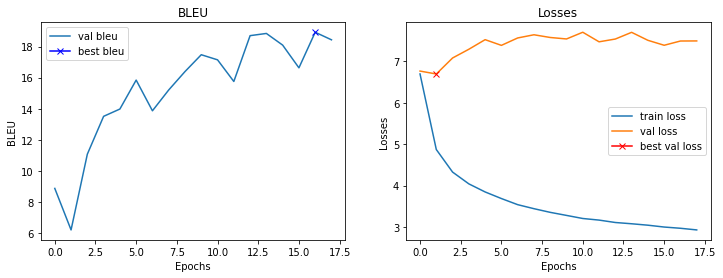

Epoch : 9500
Train example :
	Target: people UNK in the evening underneath the glow of lighted tree .
	Output: a are a a park of a road . a . .
Random example:
	Target: brunette woman in a white shirt , standing in front of a counter .
	Output: a woman in a white shirt is preparing food .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are playing a game of water .
Train loss    : 2.8998043031692506
Val loss      : 7.572451516985893
Val bleu      : 17.486141582693353



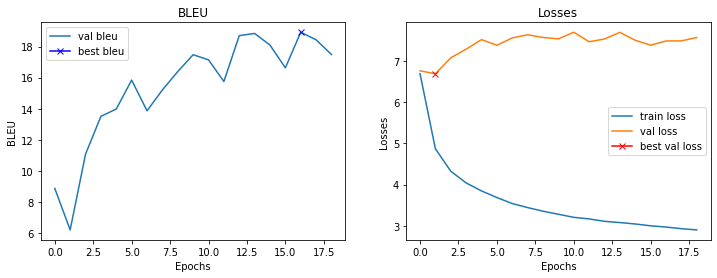

Epoch : 10000
Train example :
	Target: a young girl plays with her snowed in outdoor playhouse .
	Output: a young child in in snow sled . the snow .
Random example:
	Target: two UNK dogs play with each other .
	Output: a dog is running through the dirt .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a red shirt is sitting on a bench with a child in a red shirt .
Train loss    : 2.8819927234649656
Val loss      : 7.545829147100449
Val bleu      : 19.279210865962952



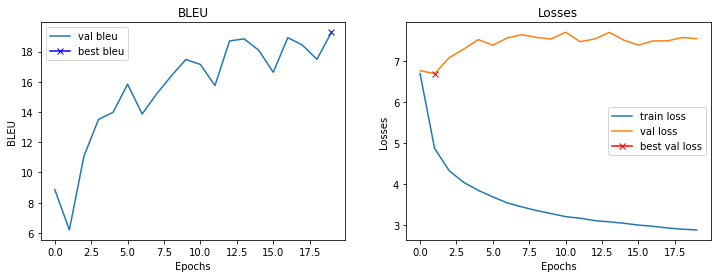

Epoch : 10500
Train example :
	Target: people are standing in a room with a television that has a picture of a boat on the water .
	Output: a are sitting in a room . one large screen is a blue . the computer . it right .
Random example:
	Target: a construction worker overseeing someone digging with a machine .
	Output: a man in a yellow shirt is working on a construction site .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are sitting on a dock .
Train loss    : 2.868164517879486
Val loss      : 7.361115753650665
Val bleu      : 20.256547743451662



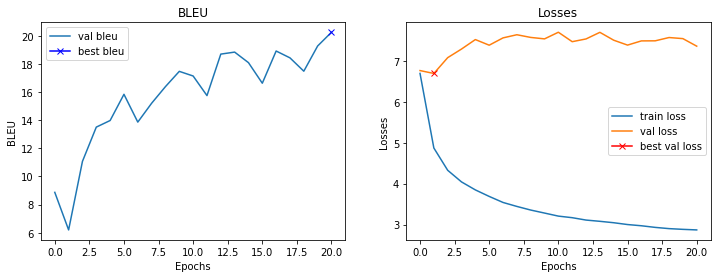

Epoch : 11000
Train example :
	Target: a man and a woman sit on a bus , but not together .
	Output: a woman in woman woman are on a bus train looking a UNK .
Random example:
	Target: a man in a white shirt hangs a painting in a run down store while other men watch .
	Output: a woman in a white shirt is walking down the street .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are playing a game of water .
Train loss    : 2.84195809173584
Val loss      : 7.478382542729378
Val bleu      : 18.616577989394997



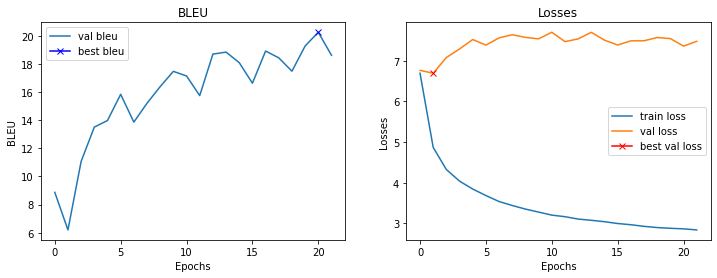

Epoch : 11500
Train example :
	Target: five people in the water .
	Output: a people in bathing water .
Random example:
	Target: man playing a fiddle on stage with other band members .
	Output: a man in a white shirt is playing a guitar .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three people are sitting on a dock .
Train loss    : 2.8220803532600405
Val loss      : 7.609936386346817
Val bleu      : 18.63356978185004



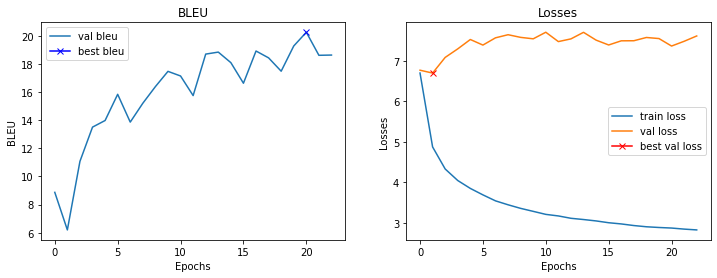

Epoch : 12000
Train example :
	Target: two construction workers in a truck as the one in the helmet is about to turn the UNK .
	Output: two men workers in orange red . a man in the back is driving to be . other .
Random example:
	Target: a man wearing a black shirt and a girl wearing an orange shirt sitting on the pavement eating .
	Output: a woman in a white shirt is sitting on the ground with her hand .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three people are sitting on a dock .
Train loss    : 2.817321656703949
Val loss      : 7.742589429020882
Val bleu      : 19.68548099667743



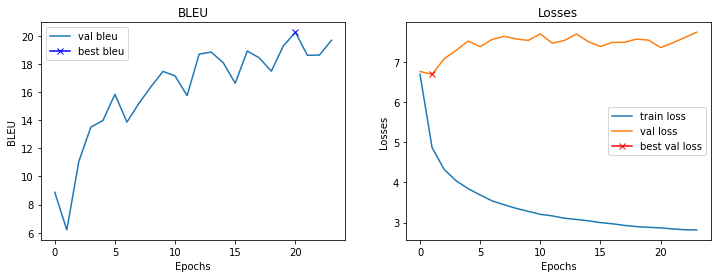

Epoch : 12500
Train example :
	Target: two men are hunched down in front of candles in what appears to be a kind of vigil .
	Output: a men are sitting a in a of a . a appears to be a crowd of bright .
Random example:
	Target: two white , long-haired dogs playing in the ocean
	Output: a dog is running through the water .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a boat .
Train loss    : 2.7624633469581603
Val loss      : 7.7760248482227325
Val bleu      : 18.09820971262375



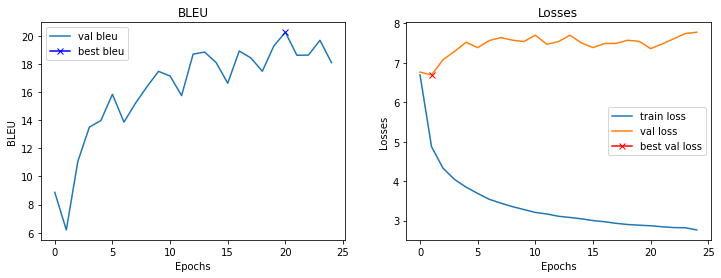

Epoch : 13000
Train example :
	Target: a person sitting on a hill outside .
	Output: a woman in on a rock in .
Random example:
	Target: man in tan jacket walking in the street .
	Output: a man in a brown jacket and a brown jacket is walking down the street .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a group of people are playing in a pool .
Train loss    : 2.764679172039032
Val loss      : 7.681011900305748
Val bleu      : 18.367739127244224



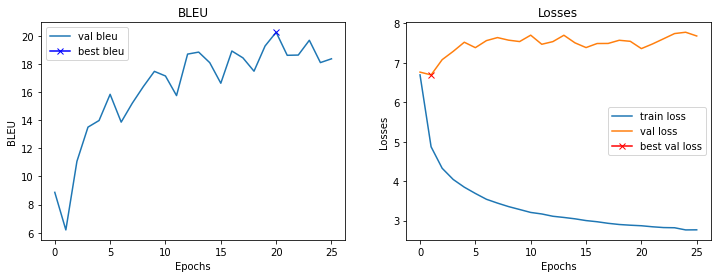

Epoch : 13500
Train example :
	Target: UNK speaking into a mic .
	Output: a UNK UNK a microphone .
Random example:
	Target: four people wearing pants have all jumped up , as the sun goes down .
	Output: a man in a yellow shirt and jeans is walking down the street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two men are working on a project .
Train loss    : 2.7466802401542663
Val loss      : 7.652644857764244
Val bleu      : 20.12180114842444



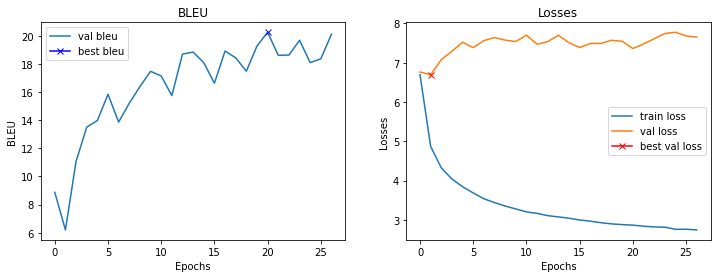

Epoch : 14000
Train example :
	Target: competitors getting ready to compete in a grand opening event hosted by the chief executive
	Output: a are ready to take in the parade parade . . . the crowd . . . . . .
Random example:
	Target: a child is turning the handle on an UNK .
	Output: a man is eating a bowl with a bowl .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: a man in a red shirt and jeans is sitting on a boat in a pool .
Train loss    : 2.725812863826752
Val loss      : 7.560011953115463
Val bleu      : 18.37601727683952



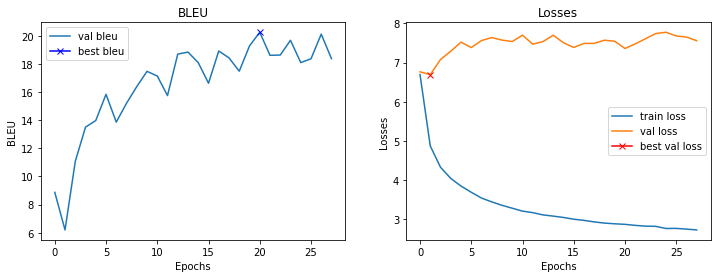

Epoch : 14500
Train example :
	Target: two girls dressed in bikinis walk outside .
	Output: a men in in black and down .
Random example:
	Target: a young boy with dark hair and skin leaning out of a window of a white bus with green and orange stripes .
	Output: a man in a blue shirt and a woman in a white shirt are sitting in front of a bus .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a man in a red shirt and a woman in a red shirt are sitting on a boat .
Train loss    : 2.7095189051628115
Val loss      : 7.712827652692795
Val bleu      : 19.10773752268379



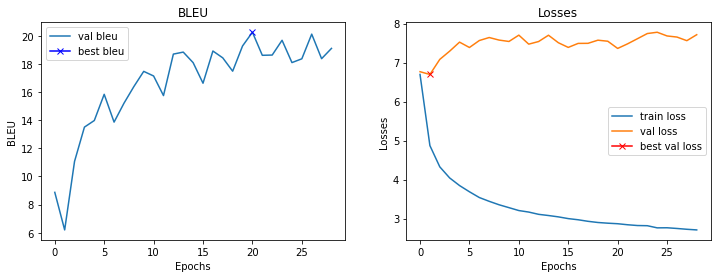

Epoch : 15000
Train example :
	Target: a man is hiking on a mountaintop on a cloudy day .
	Output: a man in rock on a rock . a mountain day .
Random example:
	Target: a boy sits on a bus and sleeps , as a man walks past the window beside him on the outside .
	Output: a woman in a black jacket is looking at a cellphone .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a project .
Train loss    : 2.699637886047363
Val loss      : 7.676740750670433
Val bleu      : 19.865920109119852



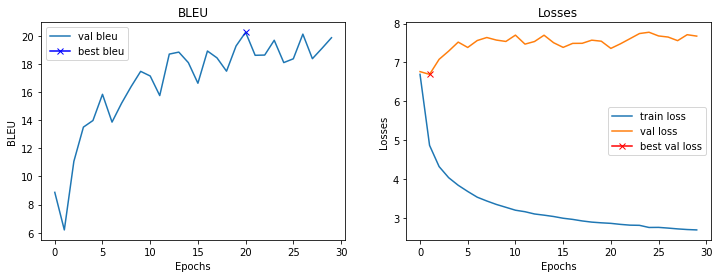

Epoch : 15500
Train example :
	Target: five males playing field hockey with man in white shirt on blue shorts on the ground .
	Output: a men playing a . on a in red shirt and the shorts . the grass .
Random example:
	Target: many people are gathered in a crowded building .
	Output: a group of people are standing in front of a large group of people .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: a group of people are sitting on a dock .
Train loss    : 2.6694796781539916
Val loss      : 7.593731954693794
Val bleu      : 20.415047529495467



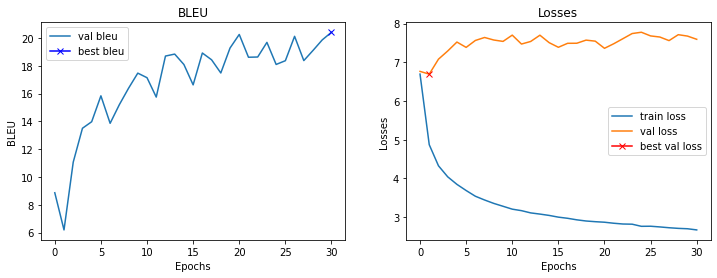

Epoch : 16000
Train example :
	Target: a woman with brown hair wearing sunglasses and a white floral headband stands in front of a microphone while a man in the background holds maracas and plays a drum set .
	Output: a woman in a hair and a and a black shirt shirt is in front of a microphone . a man in a background . a . a a guitar . of
Random example:
	Target: two children are jumping off a wall .
	Output: a young girl in a red shirt and jeans is jumping off a wall .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man is sitting on a dock with a child in a pool .
Train loss    : 2.6599079031944273
Val loss      : 7.569666162133217
Val bleu      : 19.66588103802102



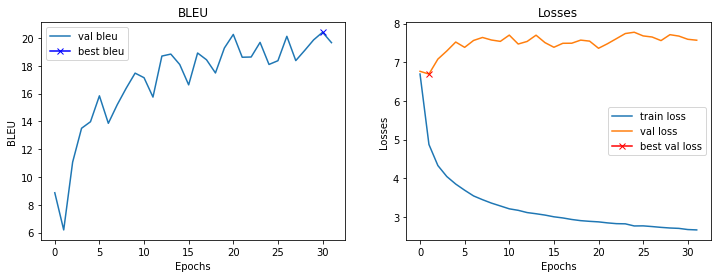

Epoch : 16500
Train example :
	Target: a girl riding a pony with braids and pink bows
	Output: a woman in a horse with a in a . . . . . . . . . . . . . . . . . . . .
Random example:
	Target: a group of men and women avoid orange cones as they explore an open town square area .
	Output: a man in a red jacket is walking down the street .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a man in a red shirt is sitting on a dock .
Train loss    : 2.6605267090797424
Val loss      : 7.6373801082372665
Val bleu      : 20.340843446031062



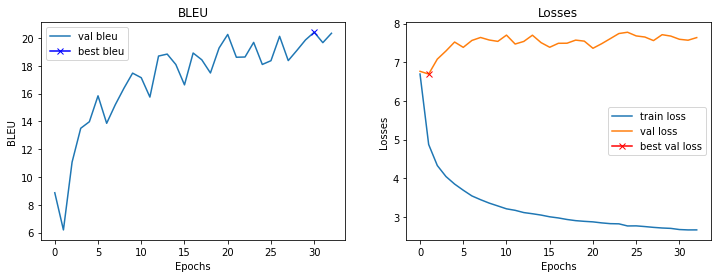

Epoch : 17000
Train example :
	Target: three chinese men trying to repair a child 's green bicycle .
	Output: a people people are to get a street on cart cart .
Random example:
	Target: two opposing hockey players make a play for the puck with opposing fans and team members watching .
	Output: two men are playing hockey .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: two men are working on a project .
Train loss    : 2.6387402935028077
Val loss      : 7.7948528826236725
Val bleu      : 19.094319080953344



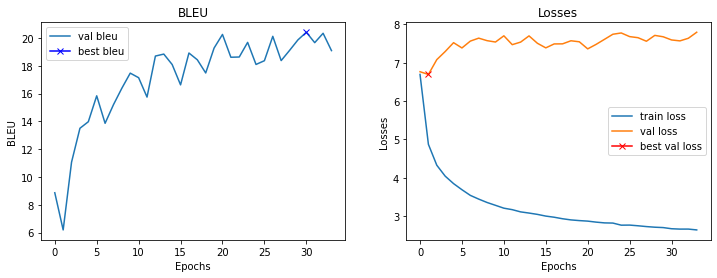

Epoch : 17500
Train example :
	Target: a young lady is sitting in a yard .
	Output: a woman girl is sitting in a field with
Random example:
	Target: a cat sits atop a sign looking down at the people below .
	Output: a dog is jumping over a fence .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.6298768153190615
Val loss      : 7.6977579444646835
Val bleu      : 20.498813198162424



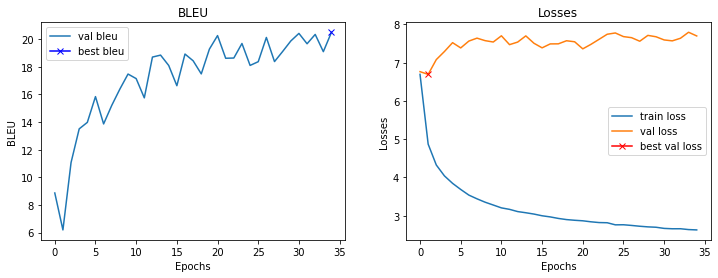

Epoch : 18000
Train example :
	Target: a brunette female is sitting on a blue bench outdoors reading a paper while a bird looks on .
	Output: a woman woman sitting sitting on a bench bench with . a book . reading book . on .
Random example:
	Target: a child with a helmet jumps over a pile of old tires .
	Output: a man in a blue shirt and jeans is standing on a tree holding a large piece of wood .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.609027458190918
Val loss      : 7.7791425585746765
Val bleu      : 19.227817186861664



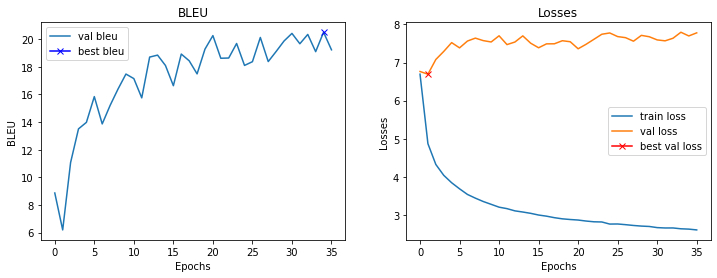

Epoch : 18500
Train example :
	Target: the man has a goatee and wear black gloves while riding a bike .
	Output: a man in a helmet on is a pants is riding his bike .
Random example:
	Target: an sooners football player UNK the tackle of two UNK defenders .
	Output: a football player is running with a football player in the background .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: three men are working on a project .
Train loss    : 2.6119359502792356
Val loss      : 7.604741647839546
Val bleu      : 19.731209383772388



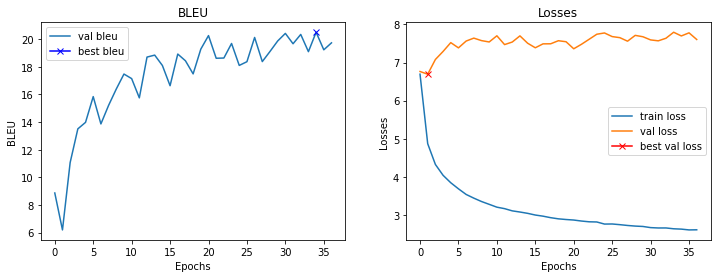

Epoch : 19000
Train example :
	Target: a female marathon runner wearing a red headband , a red tank top and black shorts jogging down a paved road .
	Output: a woman runner runner wearing a red shorts and shorts red and top and black shorts is . the street road .
Random example:
	Target: a young boy in a baseball cap jumps into the arms of a man wearing a blue shirt .
	Output: a man in a blue shirt and blue jeans is holding a baby .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are working on a boat .
Train loss    : 2.5986657390594483
Val loss      : 7.703984290361404
Val bleu      : 19.77177240080227



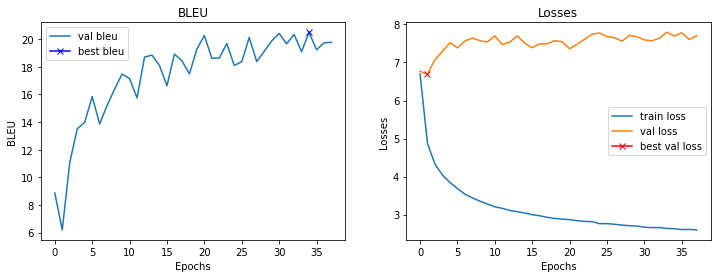

Epoch : 19500
Train example :
	Target: a man in a black sweater holds a white cup and smiles .
	Output: a man in a black t-shirt and a white cup of a .
Random example:
	Target: a little boy trying to brush a woman 's hair .
	Output: a little girl is holding a little girl .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are playing chess in a pool .
Train loss    : 2.5849743156433105
Val loss      : 7.707658186554909
Val bleu      : 19.416078972995415



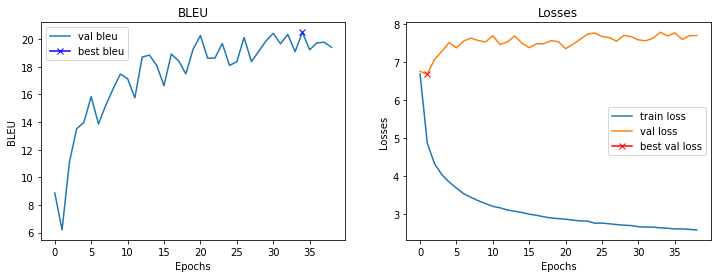

Epoch : 20000
Train example :
	Target: a dog running though a green yard .
	Output: a black running through a green field .
Random example:
	Target: two girls are sitting at a table with a green marker standing up right on the table between them .
	Output: two children sitting on a train .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: two men are working on a project .
Train loss    : 2.570541724681854
Val loss      : 7.6451912969350815
Val bleu      : 20.564812722232062



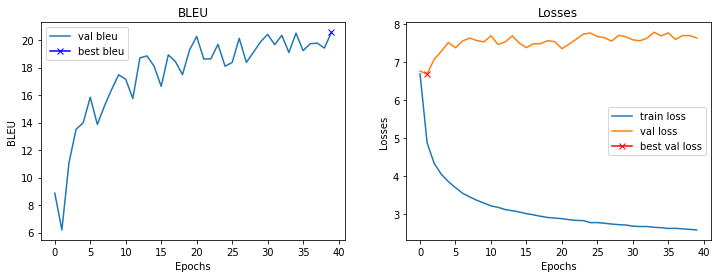

Epoch : 20500
Train example :
	Target: a man with a pipe in his mouth looks with his eyebrow raised .
	Output: a man in a beard is his mouth is at a mouth raised .
Random example:
	Target: the person in blue jeans holds a yellow fish .
	Output: a man is holding a large fish .
Fixed example :
	Target: a group of children learning to swim .
	Output: two men are working on a boat .
Train loss    : 2.5587377333641053
Val loss      : 7.669698983430862
Val bleu      : 19.25787571246046



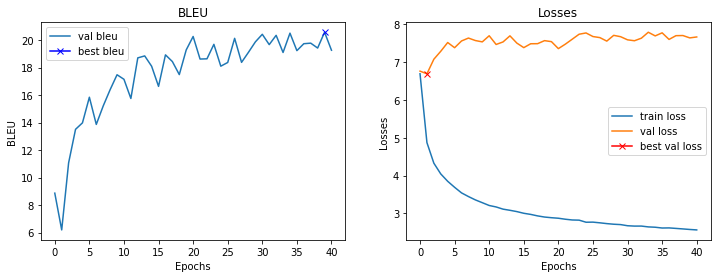

Epoch : 21000
Train example :
	Target: two young women in boots sit down on bricks outdoors and concentrate on a book with a motorcycle helmet to the side .
	Output: two women girls are jeans sit on on a . . look . a sunny . a large . . the right .
Random example:
	Target: the man in a blue shirt , wearing a helmet , is readying to climb .
	Output: a man is climbing a rock wall .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.5445101871490476
Val loss      : 7.637073904275894
Val bleu      : 19.672063998546548



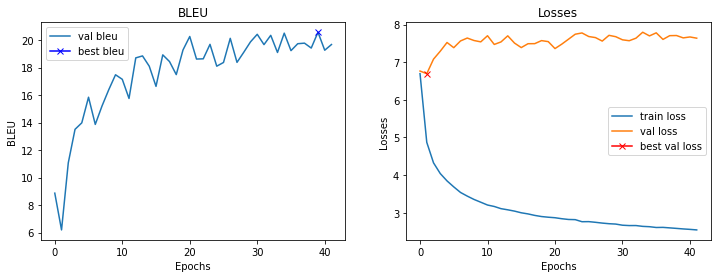

Epoch : 21500
Train example :
	Target: newborn laying in bed slightly covered up with a blanket .
	Output: a is on a with to in . a blanket .
Random example:
	Target: three men standing in the tide at a beach .
	Output: a man and a woman are walking along the beach .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: a group of people are playing in a pool .
Train loss    : 2.5453568320274353
Val loss      : 7.706993892788887
Val bleu      : 20.14128431458102



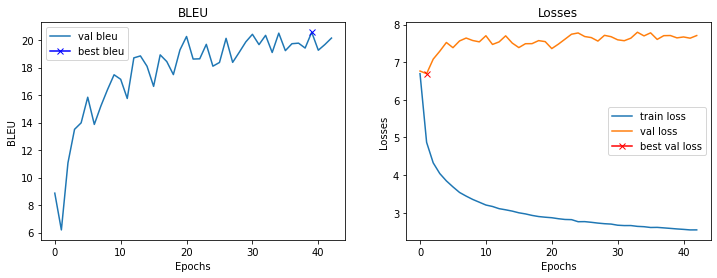

Epoch : 22000
Train example :
	Target: a man with a black had holds a long thin device while perched on a seat that is in front of a curb and bushes .
	Output: a man is a red hat is a sign pole bag . sitting on a bench . is covered front of a tree . a .
Random example:
	Target: two boys are swimming underwater with a woman in the background .
	Output: a young boy is diving into a pool .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.5260622477531434
Val loss      : 7.835589870810509
Val bleu      : 20.526517071978105



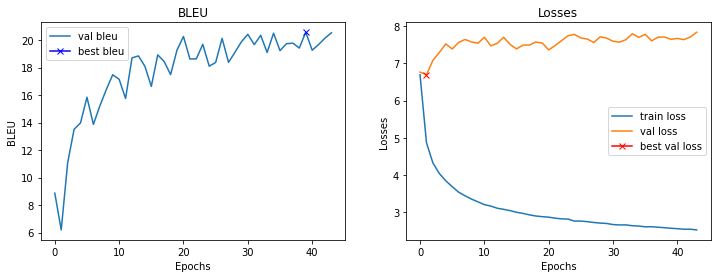

Epoch : 22500
Train example :
	Target: a red-haired clown cries streams of tears in a white hat on stage .
	Output: a man woman wearing with with his . a park helmet . a .
Random example:
	Target: children are eating various stuff at a park .
	Output: a woman in a black shirt and a woman in a black shirt are eating a sandwich .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are sitting on a boat .
Train loss    : 2.5272478847503663
Val loss      : 7.812385559082031
Val bleu      : 19.49424614565175



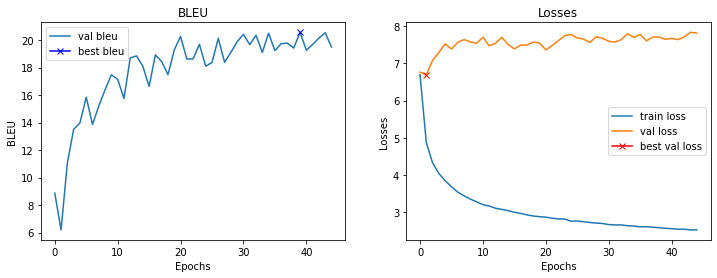

Epoch : 23000
Train example :
	Target: a man in a black shirt wearing a white and black hat .
	Output: a man in a black shirt is a white shirt black hat is
Random example:
	Target: UNK rider drives through crashing wave .
	Output: a man in a blue jacket and a woman in a blue jacket are riding a surfboard .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.522993245601654
Val loss      : 7.784040629863739
Val bleu      : 19.569042480129635



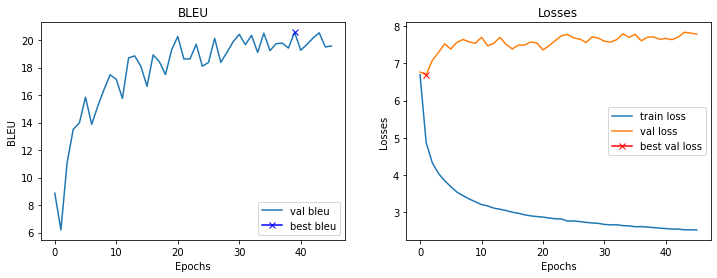

Epoch : 23500
Train example :
	Target: a army guy is talking on his UNK .
	Output: a man man is speaking on a cellphone while
Random example:
	Target: an elderly woman in a tan coat and scarf tied around her head is standing outside .
	Output: a man with a beard and a beard is standing in a city .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.5063389434814454
Val loss      : 7.8077264577150345
Val bleu      : 21.506375574823764



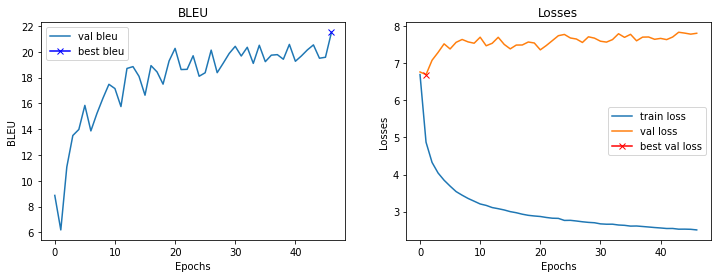

Epoch : 24000
Train example :
	Target: a woman , talking on her cellphone , and a man are standing outside of a UNK pizza restaurant , next to the subway .
	Output: a man in wearing on her cellphone , standing a man in standing behind a a restaurant store store . with to a entrance station
Random example:
	Target: workers are building something on stage in an auditorium .
	Output: two men are working on a wooden structure .
Fixed example :
	Target: a group of children learning to swim .
	Output: three people are sitting on a bench in a pool .
Train loss    : 2.48855796289444
Val loss      : 7.91387552022934
Val bleu      : 20.37764985840667



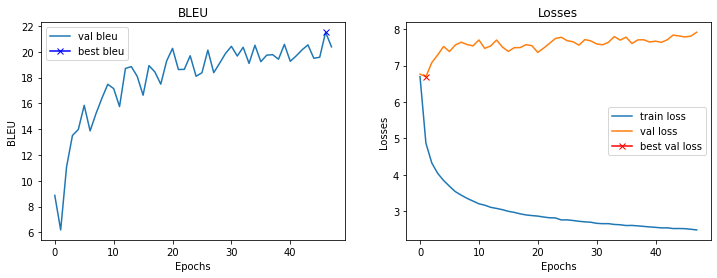

Epoch : 24500
Train example :
	Target: six spectators watching a dirt racing car pass by in a cloud of dust .
	Output: a people sit a man hill race . by a the wooded of snow .
Random example:
	Target: various people posing with their bikes at a park .
	Output: a woman in a yellow shirt and a man in a black shirt are riding a bike .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three people are sitting on a dock .
Train loss    : 2.483347267150879
Val loss      : 7.794923827052116
Val bleu      : 20.48379494414822



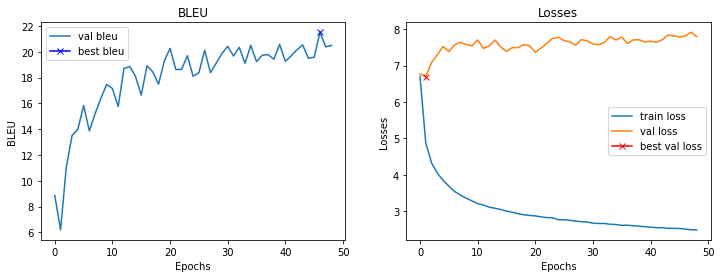

Epoch : 25000
Train example :
	Target: kids watch UNK from behind a concert barrier .
	Output: a are as on a a metal . .
Random example:
	Target: a black man with a pale blue cap and yellow shirt is sitting on a chair shining shoes .
	Output: a man wearing a mask and a mask is sitting on a chair with a blue mask .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three people are sitting on a bench in a pool .
Train loss    : 2.4764484634399415
Val loss      : 7.733448535203934
Val bleu      : 19.981569566954747



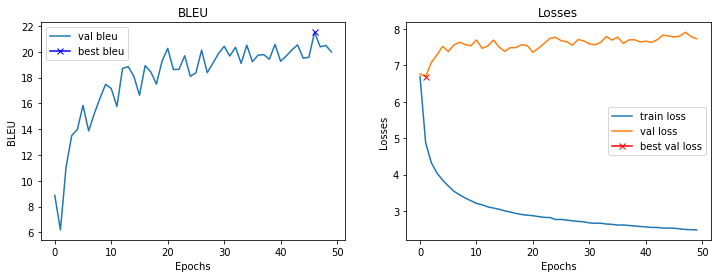

Epoch : 25500
Train example :
	Target: this person is walking down the street and talking on their cellphone on a windy day .
	Output: two woman is taking through a sidewalk . looking on a cellphone . a cellphone day .
Random example:
	Target: two guitarists are performing in front of a gum ball machine .
	Output: a man in a black shirt and blue jeans is playing a guitar .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a boat .
Train loss    : 2.4750883717536927
Val loss      : 7.829109281301498
Val bleu      : 20.372050542615845



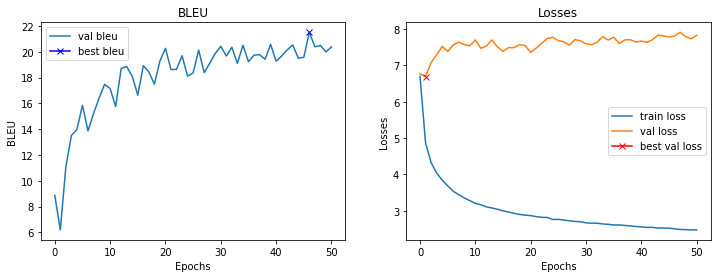

Epoch : 26000
Train example :
	Target: women in costume performing on stage .
	Output: a in colorful with in stage .
Random example:
	Target: a brown-haired girl stoops to pick up a small white puppy on an empty street .
	Output: a white dog is walking on a sidewalk with a white dog .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are sitting on a boat in a pool .
Train loss    : 2.456021007299423
Val loss      : 7.807229965925217
Val bleu      : 20.688159531152504



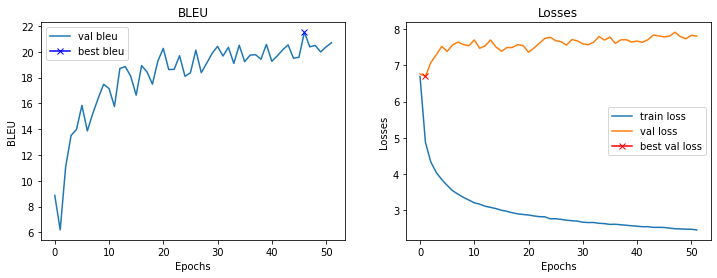

Epoch : 26500
Train example :
	Target: the attractive young brunette girl in a red bikini jumps into a pool in the backyard .
	Output: a girl woman girl girl is a red bathing is into a pool . a water .
Random example:
	Target: two people that are wearing oriental clothing are walking down the street
	Output: a man walking down a sidewalk .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: two men are working on a project .
Train loss    : 2.447358932495117
Val loss      : 7.859286576509476
Val bleu      : 20.773085286566182



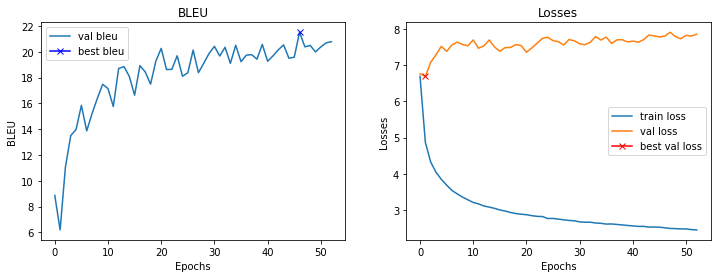

Epoch : 27000
Train example :
	Target: a group of men wait in line to UNK food at a window .
	Output: two group of people are for line for be food . a restaurant .
Random example:
	Target: a family in a log cabin setting up for a birthday party
	Output: a woman and a child are playing with a board game .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a project .
Train loss    : 2.4435546448230743
Val loss      : 7.823811456561089
Val bleu      : 20.34890217046624



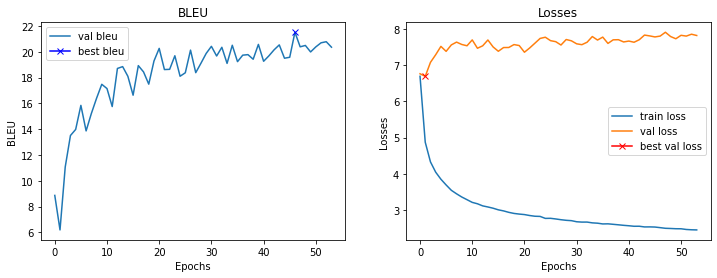

Epoch : 27500
Train example :
	Target: a girl in a bathing suit , swim cap and goggles .
	Output: a young in a blue suit and goggles cap and a is
Random example:
	Target: a man in camouflage and a helmet holds a machine gun .
	Output: a man in a green shirt is shooting a gun .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are working on a project .
Train loss    : 2.441147298336029
Val loss      : 7.829774349927902
Val bleu      : 20.374412675069838



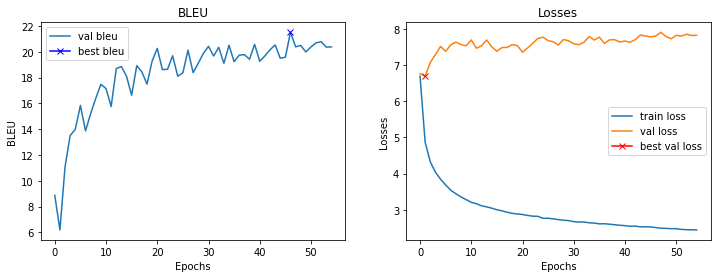

Epoch : 28000
Train example :
	Target: two people in blue uniforms , one with a white hat , stand by shrubs .
	Output: two police are a uniforms are one wearing a hat hat , are in a .
Random example:
	Target: photographers take pictures of a girl sitting in a street .
	Output: a woman in a white dress is walking down the street .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.4411936807632446
Val loss      : 7.808254286646843
Val bleu      : 20.738709738939782



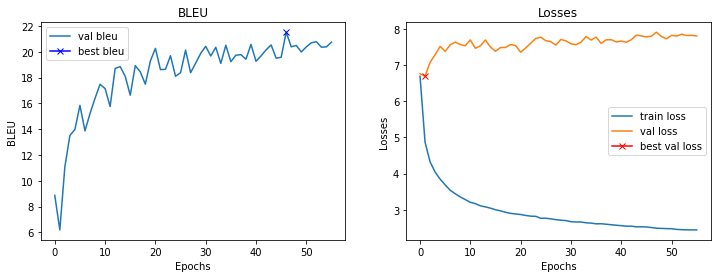

Epoch : 28500
Train example :
	Target: a woman eating food with her hands .
	Output: a woman is a at a hands .
Random example:
	Target: three women in UNK , dark brown shawls , and long brown skirts stand on a brick walkway with a seated dog .
	Output: a man in a black coat and a hat is walking on the street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are working on a project .
Train loss    : 2.43369171333313
Val loss      : 7.818280845880508
Val bleu      : 20.468730047388718



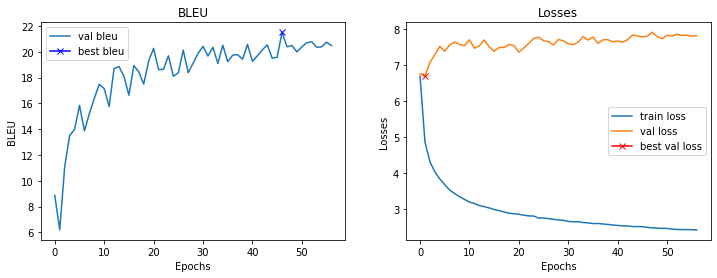

Epoch : 29000
Train example :
	Target: two young boys play in the water that has collected on the street .
	Output: a women women are in a water . are UNK water the sidewalk .
Random example:
	Target: a boy walking wearing a uniform .
	Output: a young boy in a black shirt and blue jeans is running on a street .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a project .
Train loss    : 2.417422648668289
Val loss      : 7.945997029542923
Val bleu      : 20.48676183678462



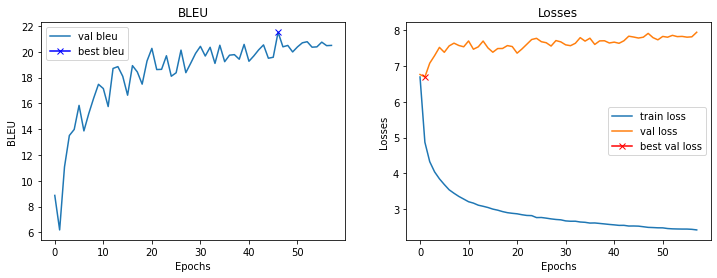

Epoch : 29500
Train example :
	Target: a clown making a balloon animal for a pretty lady .
	Output: a woman in a balloon balloon . a clown woman .
Random example:
	Target: a group of UNK are walking in the city .
	Output: a man in a red shirt and black hat is walking down the street .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are working on a project .
Train loss    : 2.4179126753807068
Val loss      : 7.849042534828186
Val bleu      : 20.13631349746958



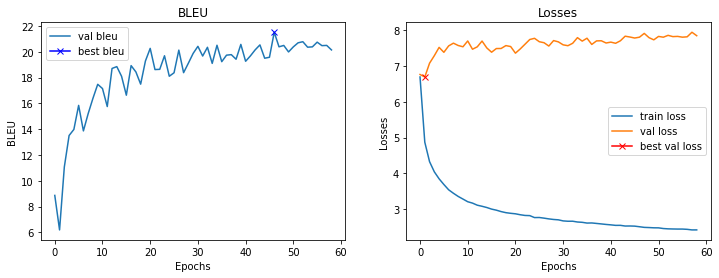

Epoch : 30000
Train example :
	Target: a four member band stands on stage as a man adjusts their equipment .
	Output: a band band band is in stage in a band in his hands .
Random example:
	Target: a half naked man surfs on a board down a water slide as people watch him .
	Output: a woman in a bikini jumping into a pool .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three people are sitting on a dock .
Train loss    : 2.413737399101257
Val loss      : 7.849155813455582
Val bleu      : 20.355030490547318



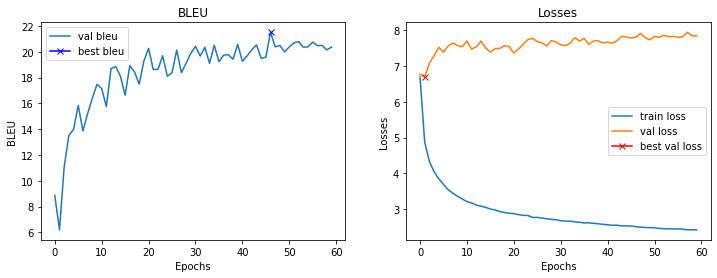

Epoch : 30500
Train example :
	Target: one guy fixes his bicycle while another guy leans against a car .
	Output: a man riding a bicycle in another child watches on a wall .
Random example:
	Target: a young woman is drawing with a UNK marker .
	Output: a woman with long brown hair and a black shirt is holding a pencil .
Fixed example :
	Target: swimming UNK teaching young girls how to float in a pool .
	Output: three men are working on a project .
Train loss    : 2.4158871185779573
Val loss      : 7.862541556358337
Val bleu      : 20.294047447845806



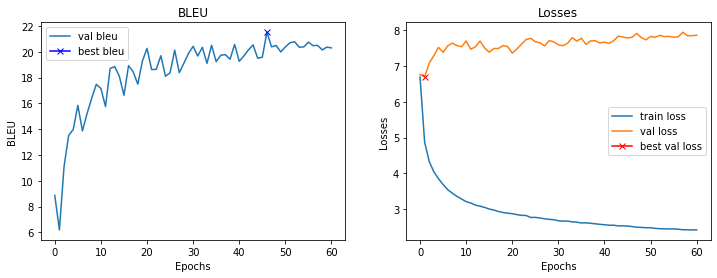

Epoch : 31000
Train example :
	Target: a young woman in a pink fleece sweater uses her laptop to study in bed .
	Output: a woman girl in a pink jacket jacket sits a laptop to a . her .
Random example:
	Target: an older man digs up sand while a younger girl watches him .
	Output: a girl in a black and white bathing suit is playing in the sand .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.4159107341766357
Val loss      : 7.819010600447655
Val bleu      : 20.7953971813564



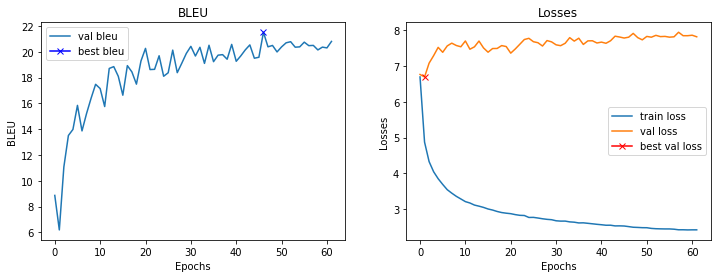

Epoch : 31500
Train example :
	Target: a dj in a white shirt has a wristband on .
	Output: a dj with a blue shirt is a tattoo on his
Random example:
	Target: an asian woman in a red sweater holding her baby .
	Output: a baby is smiling and smiling .
Fixed example :
	Target: swimming UNK show young girls how to float .
	Output: three men are working on a project .
Train loss    : 2.4127196638584136
Val loss      : 7.841963589191437
Val bleu      : 20.499203507810627



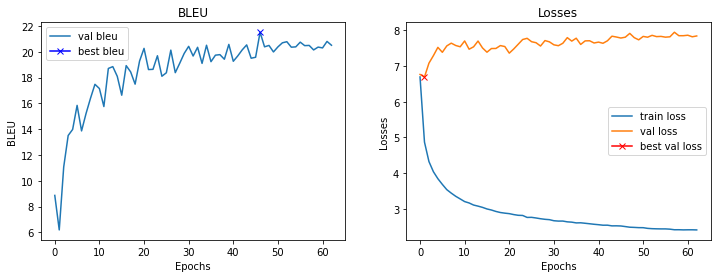

Epoch : 32000
Train example :
	Target: a woman in a white t-shirt and a boy in a turquoise shirt are looking in the freezer section of a store .
	Output: a woman in a white shirt and a black in a blue shirt are standing at a store . of a store .
Random example:
	Target: several people are riding bikes with people in stands watching .
	Output: a group of people are riding bikes in a gym .
Fixed example :
	Target: man in black swimsuit plays in pool with three young children .
	Output: three men are working on a project .
Train loss    : 2.4110543801784514
Val loss      : 7.818174853920937
Val bleu      : 21.145028209942446



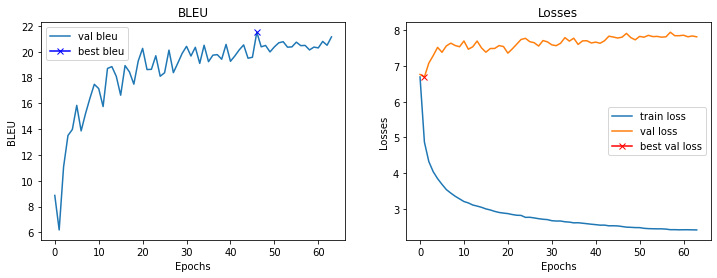

Epoch : 32500
Train example :
	Target: several men making a net on a beach .
	Output: a people and a large on a beach .
Random example:
	Target: a man tries to take a picture of a woman and himself kissing while they are standing surrounded by flowers .
	Output: a woman in a yellow shirt is holding a bouquet of flowers .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are working on a project .
Train loss    : 2.394461316347122
Val loss      : 7.8171117305755615
Val bleu      : 20.819690490237974



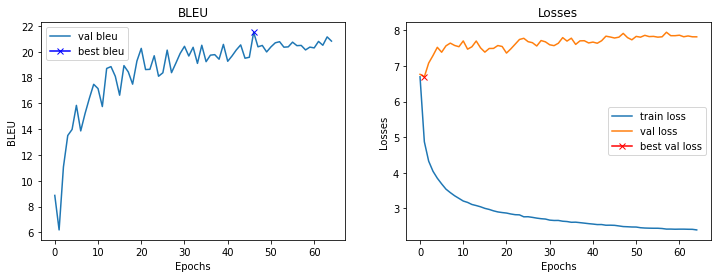

Epoch : 33000
Train example :
	Target: kid skateboarder showing off tricks .
	Output: a in riding off a on
Random example:
	Target: a boy in a red shirt and white shorts is standing in the sand .
	Output: a young girl in a pink shirt and shorts is playing in the sand .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.3899582271575928
Val loss      : 7.845551118254662
Val bleu      : 20.63341816093133



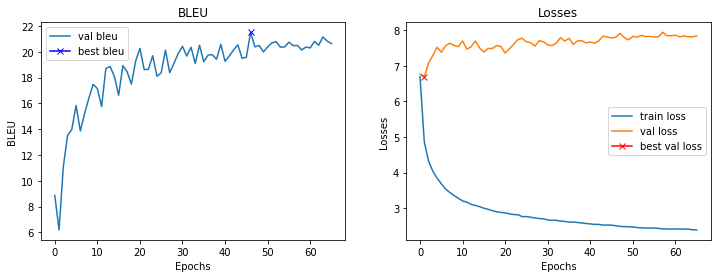

Epoch : 33500
Train example :
	Target: man and woman standing together on a cobbled street having their picture taken .
	Output: two in woman posing in . a sidewalk street . a picture taken .
Random example:
	Target: a street musician sitting playing guitar with an open case and a sign reading " tell me why my music sucks " .
	Output: a man in a black shirt is standing in front of a crowd of people .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.385825319290161
Val loss      : 7.857111096382141
Val bleu      : 20.690122064210474



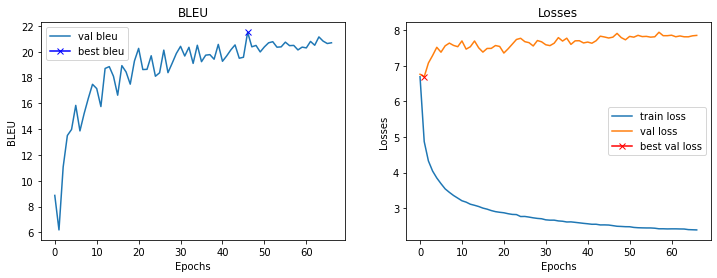

Epoch : 34000
Train example :
	Target: three young women pose for the camera while a crowd stands behind them .
	Output: a young women are for a camera . a crowd of behind them .
Random example:
	Target: several dancers with tight black pants , skirts , and colorful scarves dance .
	Output: two women are dancing in a dark room .
Fixed example :
	Target: two men in wetsuits UNK children as they learn to swim .
	Output: three men are working on a project .
Train loss    : 2.3806869325637816
Val loss      : 7.850775361061096
Val bleu      : 20.666550896253284



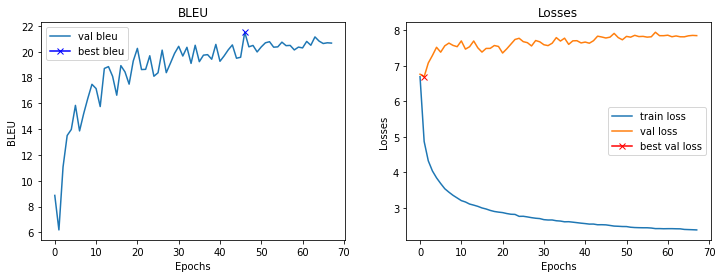

Epoch : 34500
Train example :
	Target: a young skateboarder in a pile of leaves with a smile on his face .
	Output: a man boy is a pile of leaves . a pile . the shoulder .
Random example:
	Target: two men sing into a microphone , one with his arm outstretched , the other composed , while an UNK crowd looks on .
	Output: a man in a white shirt is dancing with a man in a white shirt and jeans .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.389100603580475
Val loss      : 7.921104669570923
Val bleu      : 20.93137990870984



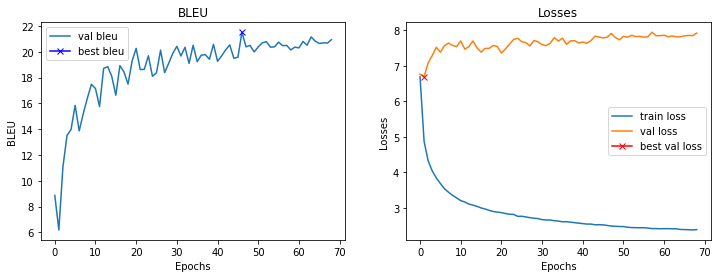

Epoch : 35000
Train example :
	Target: an asian woman sits and serves a meal that she has just prepared .
	Output: a asian woman is at holds a plate . has is a been to
Random example:
	Target: bubbles surround a statue in the middle of a street .
	Output: a group of people are walking down a street .
Fixed example :
	Target: a group of children learning to swim .
	Output: three men are working on a project .
Train loss    : 2.392860885620117
Val loss      : 7.845263093709946
Val bleu      : 20.89678929682064



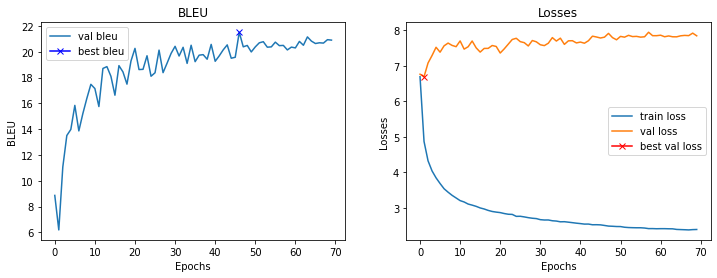

CPU times: user 9h 24min 11s, sys: 44min 9s, total: 10h 8min 21s
Wall time: 6h 3min 33s


In [0]:
%%time
best_bleu = 0
epoch_loss = 0
train_losses = []
val_losses = []
bleu = []

for epoch in range(1, max_epochs+1):

  image_vectors, captions_ix = generate_batch(train_dataset, batch_size)
  image_vectors, captions_ix = image_vectors.to(device), captions_ix.to(device)

  captions_ix_next = captions_ix[:, 1:].contiguous()

  network.train()
  network.encoder.eval()

  optimizer.zero_grad()
        
  outputs = network(image_vectors, captions_ix) 
 
  loss = criterion(outputs[:, :-1].contiguous().view(-1, outputs.shape[-1]), captions_ix_next.view(-1))
        
  loss.backward()
        
  torch.nn.utils.clip_grad_norm_(network.parameters(), clip)
        
  optimizer.step()

  scheduler.step()
        
  epoch_loss += loss.item()

  if epoch % every_epochs == 0:
    print('Epoch : {}'.format(epoch))
    print('Train example :')
    print('\tTarget: {}'.format(translate(captions_ix_next[0].tolist())))
    print('\tOutput: {}'.format(translate(outputs[:, :-1].argmax(-1)[0].tolist())))
    val_loss, val_bleu = evaluate(network, criterion)   
    print('Train loss    : {}'.format(epoch_loss / every_epochs))
    print('Val loss      : {}'.format(val_loss))
    print('Val bleu      : {}'.format(val_bleu))
    print()
    train_losses.append(epoch_loss / every_epochs)
    val_losses.append(val_loss)
    bleu.append(val_bleu)
    if val_bleu > best_bleu:
      best_bleu = val_bleu
      torch.save(network.state_dict(), '/content/drive/My Drive/Image Captioning/Flickr30/transformer_model_best_bleu.pt')
    epoch_loss = 0
    plot_loss()

# Проверим качество полученной модели

In [0]:
import skimage.transform
import matplotlib.cm as cm

In [0]:
# Визуализация attention
def visualize_att(image_path, seq, atts, smooth=True):

    image = Image.open(image_path)
    image = image.resize([8 * 24, 8 * 24], Image.LANCZOS)

    words = seq.split() 

    plt.figure(figsize=(10, np.ceil(len(words) / 5.) * 2))
    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)

        plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        current_att = atts[t, :].reshape(8, 8)
        if smooth:
            att = skimage.transform.pyramid_expand(current_att, upscale=24, sigma=8)
        else:
            att = skimage.transform.resize(current_att, [8 * 24, 8 * 24])

        plt.imshow(att, alpha=0.75)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()

## Модель с лучшим BLEU

In [0]:
network.load_state_dict(torch.load('/content/drive/My Drive/Image Captioning/Flickr30/transformer_model_best_bleu.pt'))

<All keys matched successfully>

In [0]:
network.eval()
network = network.to(device)


Сначала посмотрим на примеры из валидационного датасета:

In [0]:
num_img = 992

[' swimming instructors teaching young girls how to float in a pool .'
 ' man in black swimsuit plays in pool with three young children .'
 ' two men in wetsuits supervise children as they learn to swim .'
 ' swimming instructors show young girls how to float .'
 ' a group of children learning to swim .']


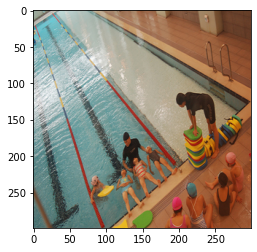

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

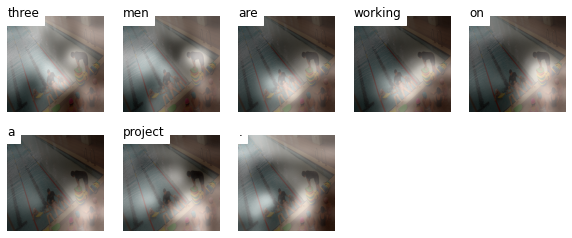

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=False)
visualize_att(image_path, seq, att, smooth=True)

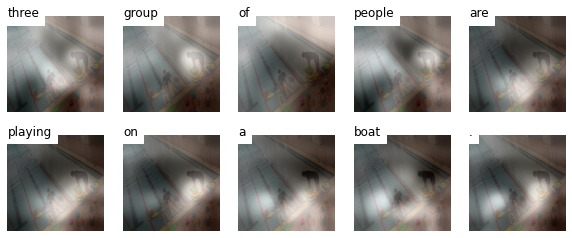

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=3)
visualize_att(image_path, seq, att, smooth=True)

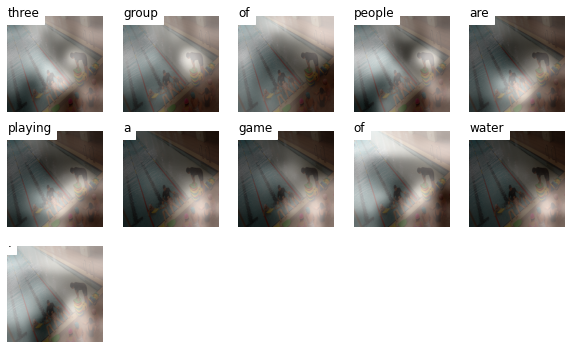

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=2)
visualize_att(image_path, seq, att, smooth=True)

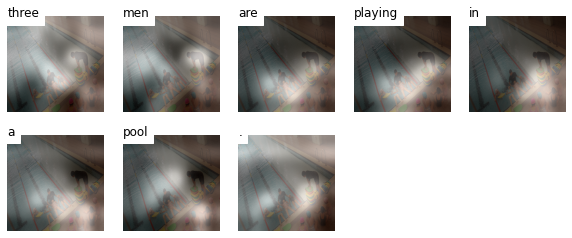

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=3)
visualize_att(image_path, seq, att, smooth=True)

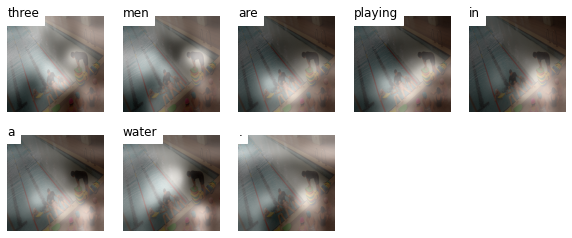

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=2)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

780

[' two toddler girls appear to enjoy basking on a pile of leaves as they smile for the camera .'
 ' two young girls with their heads peeking out at the camera from a huge pile of leaves .'
 ' two female toddler-aged children smiling from inside a pile of autumn leaves .'
 ' two kids peek their head from a pile of leaves on a beautiful fall day .'
 ' two children are playing in a pile of fallen leaves .']


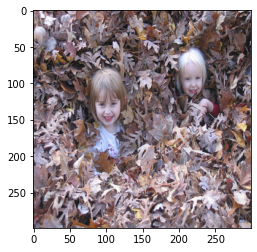

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

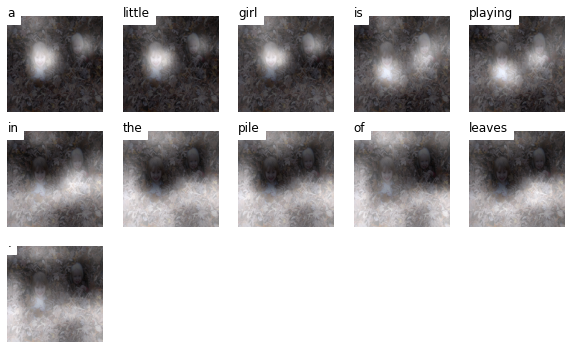

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device))
visualize_att(image_path, seq, att, smooth=True)

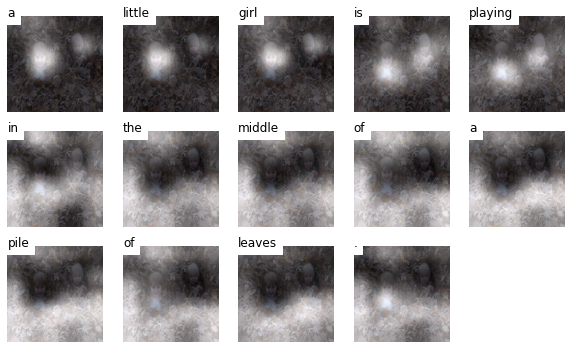

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=2)
visualize_att(image_path, seq, att, smooth=True)

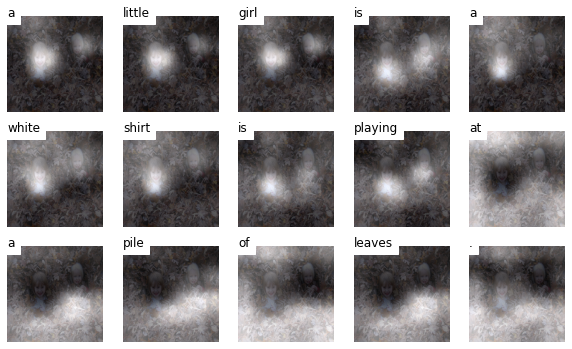

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=2)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

790

[' a brown and white dog with a black collar and gold tag licking the snow from its nose .'
 ' the brown and white dog licks the snow off of his cold nose .'
 ' a white and brown dog licks his lips during winter .'
 ' a shaggy dog dusted with snow licks its nose .'
 ' a dog licking its lips while snowfalls .']


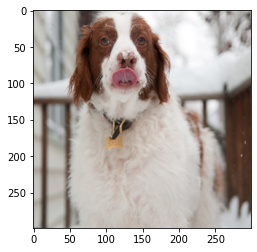

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

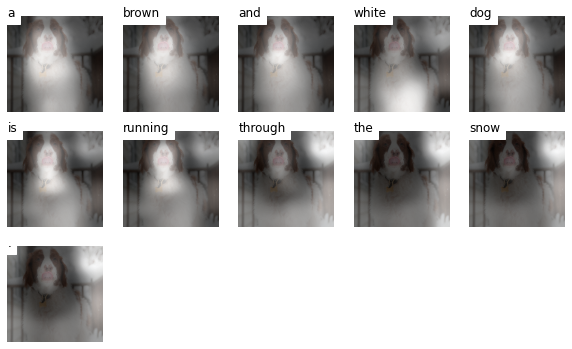

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device))
visualize_att(image_path, seq, att, smooth=True)

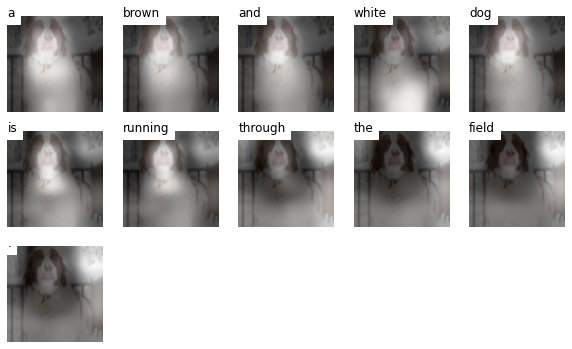

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=3)
visualize_att(image_path, seq, att, smooth=True)

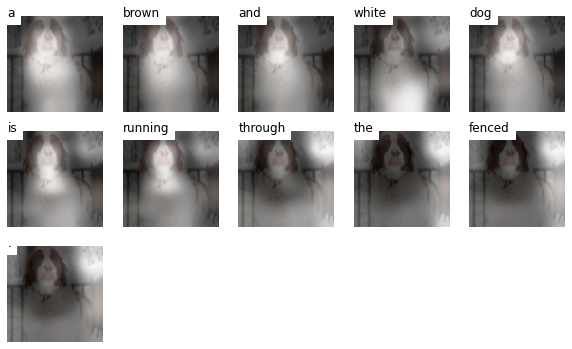

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=2)
visualize_att(image_path, seq, att, smooth=True)

In [0]:
num_img = random.randint(0, len(val_dataset))

In [0]:
num_img

311

[' two dogs playing in the water , one is bounding at the other .'
 ' two white dogs are splashing around in white waves .'
 ' two white , long-haired dogs playing in the ocean'
 ' two furry beige dogs playing in ocean surf .'
 ' two dogs playing in the water .']


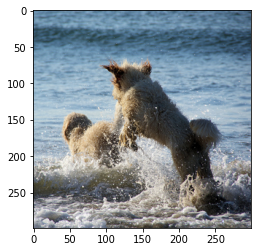

In [0]:
val_dataset.show_sample(num_img)

In [0]:
img, cap = val_dataset[num_img]

In [0]:
image_path = os.path.join(val_dataset.root_dir,
                                val_dataset.data_frame.image_name[num_img])

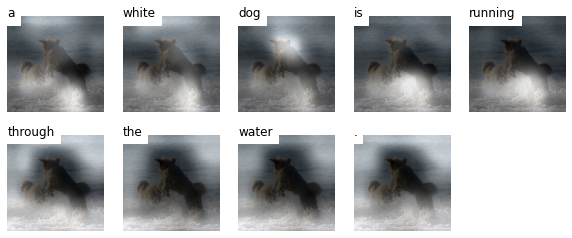

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device))
visualize_att(image_path, seq, att, smooth=True)

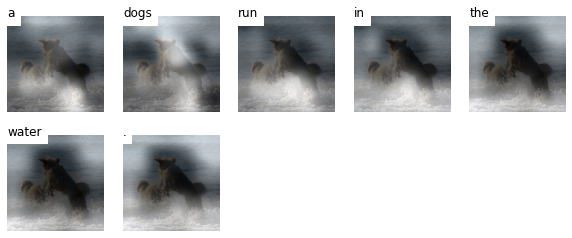

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=3)
visualize_att(image_path, seq, att, smooth=True)

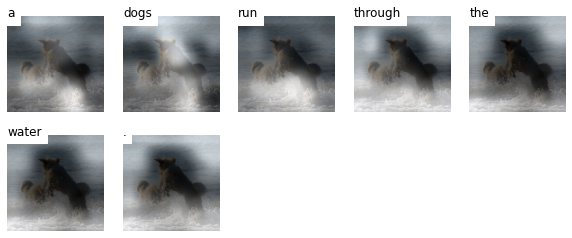

In [0]:
seq, att = network.generate(img.unsqueeze(0).to(device), sample=True, st=3)
visualize_att(image_path, seq, att, smooth=True)

Теперь проверим на произвольных картинках:

2020-05-15 21:35:12 URL:https://pyxis.nymag.com/v1/imgs/6ac/2a6/b48d3a180f333298f5bee60ff80f4ba886-12-tony-hawk.h473.w710.jpg [54731/54731] -> "img.jpg" [1]


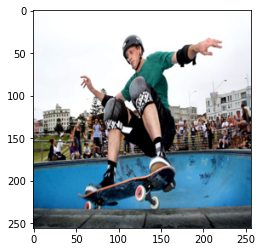

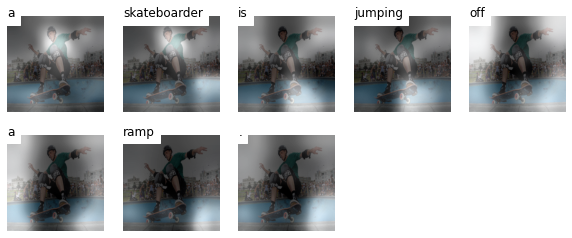

In [0]:
!wget -nv https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

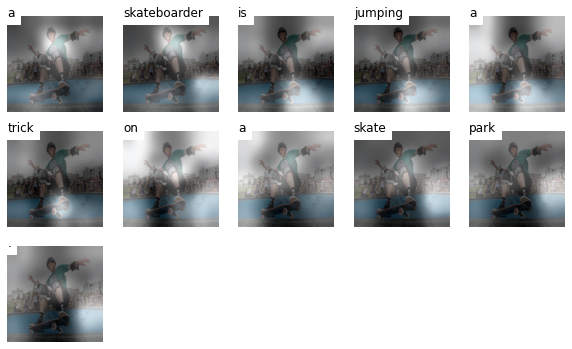

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

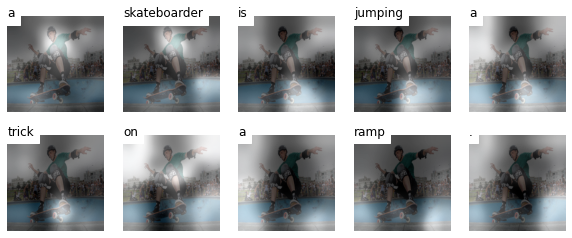

In [0]:
seq, att = network.generate(img, sample=True, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-05-15 22:27:02 URL:https://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg [106870/106870] -> "img.jpg" [1]


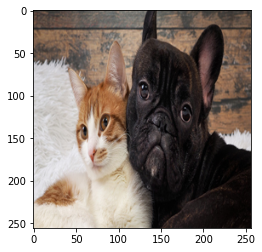

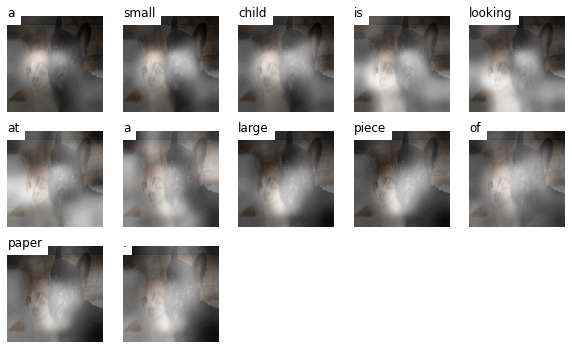

In [0]:
!wget -nv http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

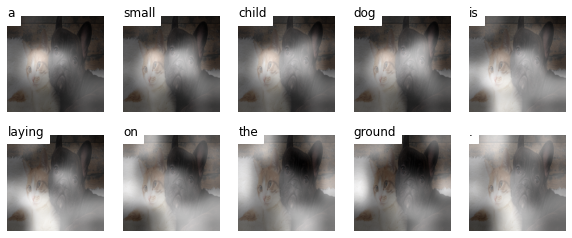

In [0]:
seq, att = network.generate(img, sample=True, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

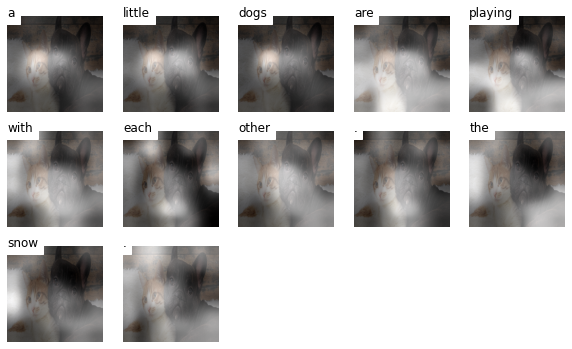

In [0]:
seq, att = network.generate(img, sample=True, st=2)
visualize_att('img.jpg', seq, att, smooth=True)

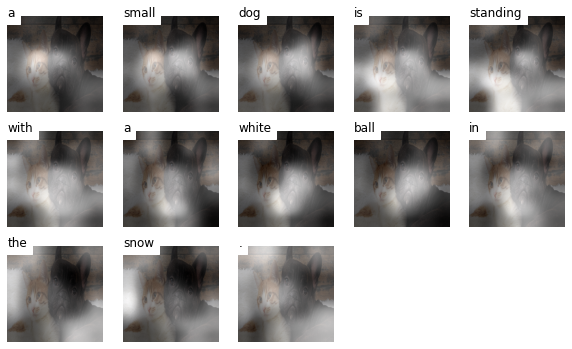

In [0]:
seq, att = network.generate(img, sample=True, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

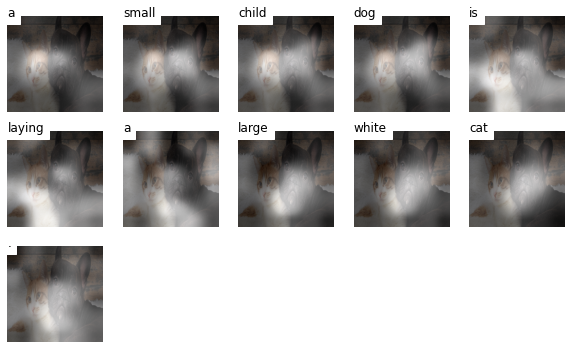

In [0]:
seq, att = network.generate(img, sample=True, st=3)
visualize_att('img.jpg', seq, att, smooth=True)

2020-05-15 21:42:50 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 [8560/8560] -> "img.jpg" [1]


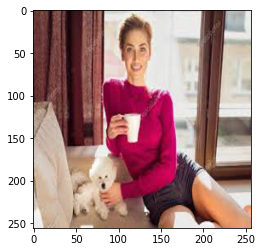

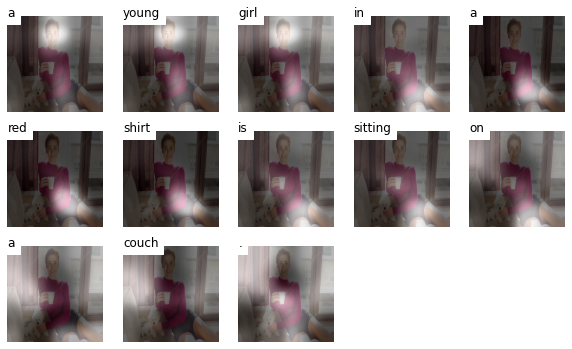

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcReseHyoffy4WlXRV7odBq0ZLxmNdgvxlvs4f1mv1ZV5jm7JRC6 -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

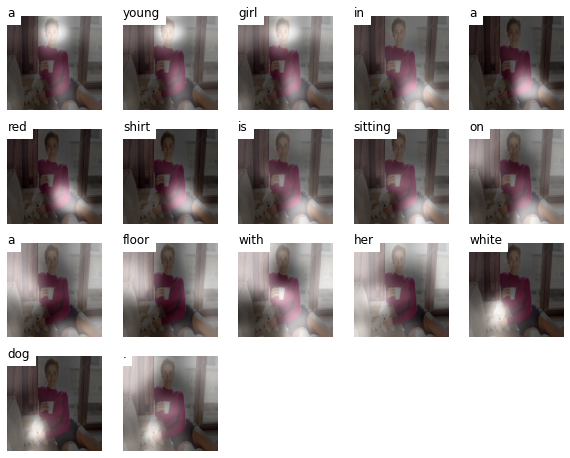

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

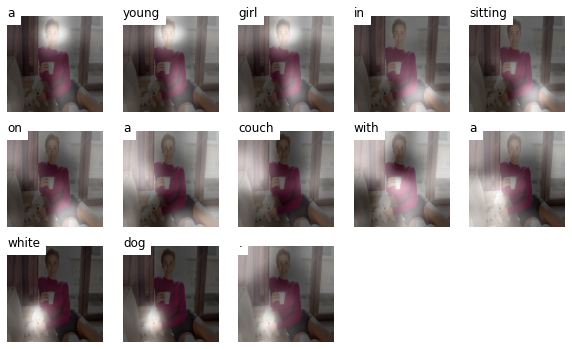

In [0]:
seq, att = network.generate(img, sample=True, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-05-15 22:21:57 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX [8192/8192] -> "img.jpg" [1]


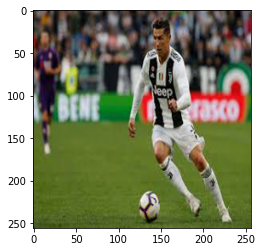

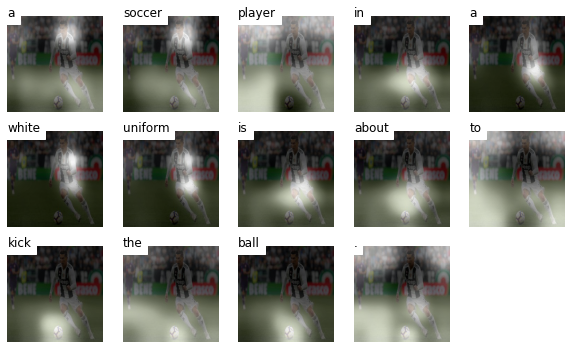

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTsDlSPHluolntOWcD-Fjlvjk4pv-_54p4hajvCg29rnNyY5LFX -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

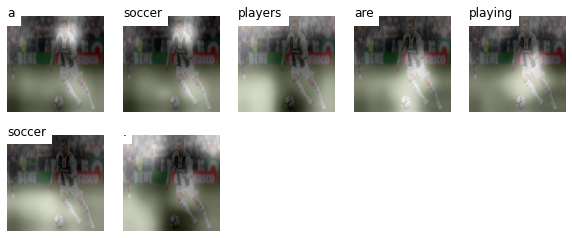

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

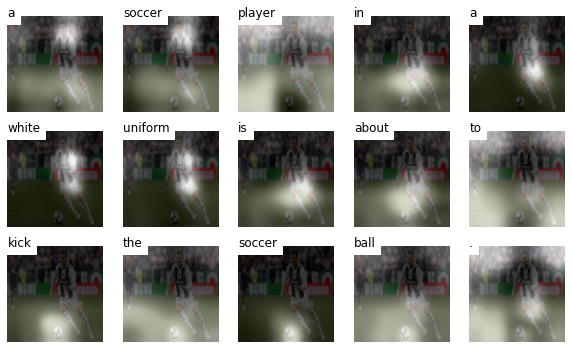

In [0]:
seq, att = network.generate(img, sample=True, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-05-15 22:25:24 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z [5331/5331] -> "img.jpg" [1]


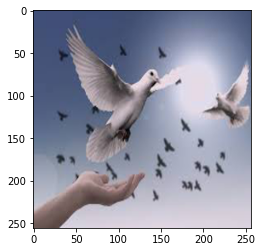

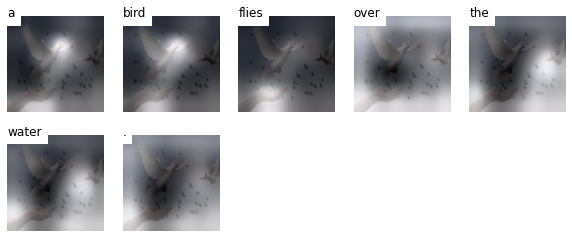

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRLy3gwG_Oz7rVPRnTaWsmCNoI-Lpj86KEQCW1ag02fRwrBMA0Z -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

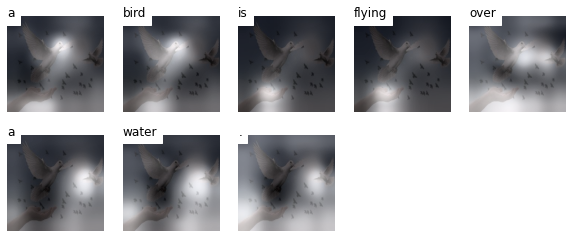

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

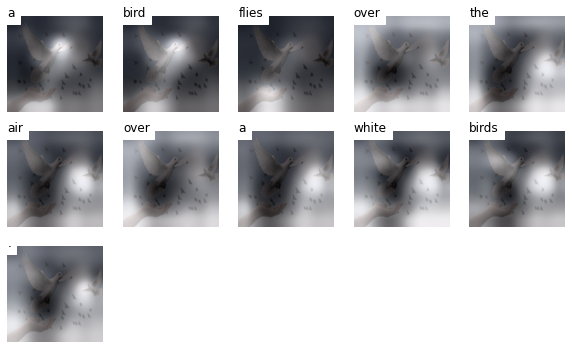

In [0]:
seq, att = network.generate(img, sample=True, st=5)
visualize_att('img.jpg', seq, att, smooth=True)

2020-05-15 22:05:08 URL:https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK [9963/9963] -> "img.jpg" [1]


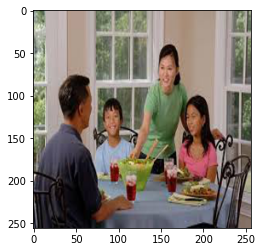

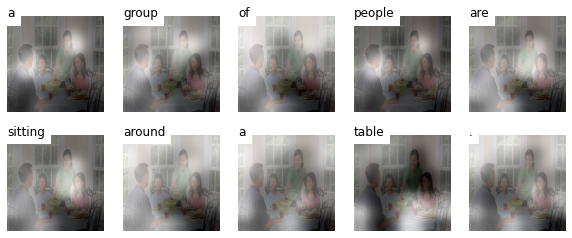

In [0]:
!wget -nv https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT50JLrar0jIMcl1A3MeTJiMRj0SBJAflY4l2Qx9hZR1U_tw8jK -O img.jpg
img = plt.imread('img.jpg')
img = np.array(Image.fromarray(img).resize((256, 256))).astype('float32') / 255.
plt.imshow(img)
plt.show()
img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32) 
img = image_transform(img).unsqueeze(0).to(device)

seq, att = network.generate(img)
visualize_att('img.jpg', seq, att, smooth=True)

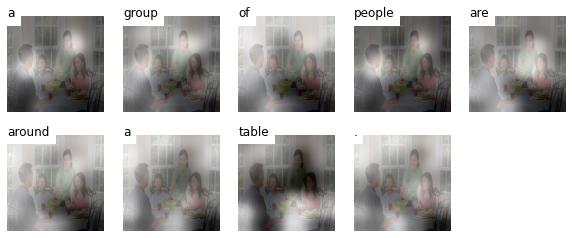

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

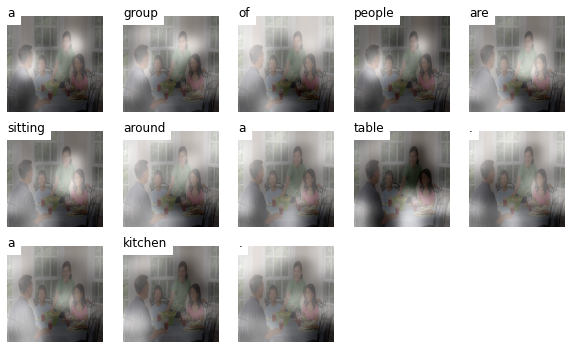

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)

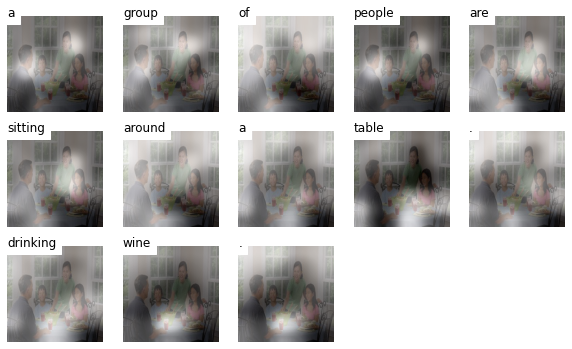

In [0]:
seq, att = network.generate(img, sample=True)
visualize_att('img.jpg', seq, att, smooth=True)